# Validações Estatísticas do BeamNG como Digital Twin — v7

Estrutura de comparação:
```
simulado_1 × real_1
simulado_1 × real_2
simulado_1 × real_3
─────────────────────
simulado_2 × real_1
simulado_2 × real_2
simulado_2 × real_3
...
```
Ao final: heatmap e tabela comparando todos os pares.

## 1. Imports

In [22]:
try:
    from dtaidistance import dtw, dtw_ndim
except ImportError:
    import subprocess, sys
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', 'dtaidistance', '-q'])
    from dtaidistance import dtw, dtw_ndim

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, f_oneway
from scipy.signal import correlate, detrend
from sklearn.preprocessing import MinMaxScaler
from os import listdir
from os.path import join
import ast
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({
    'figure.dpi': 120,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.grid': True,
    'grid.alpha': 0.3,
})
print('OK')

OK


## 2. Configuração

In [23]:
# ─── AJUSTE AQUI ─────────────────────────────────────────────────────────────
PASTA_REAL     = 'circuito4/real'
PASTA_SIMULADO = 'circuito4/testando_agressivity'
N_SEGMENTOS    = 10
COLUNAS_CORR   = ['posX', 'posY', 'posZ', 'vel']
# ─────────────────────────────────────────────────────────────────────────────

arquivos_real = sorted(listdir(PASTA_REAL))
arquivos_sim  = sorted(listdir(PASTA_SIMULADO))

print(f'Reais:      {len(arquivos_real)} arquivos')
for f in arquivos_real:
    print(f'  {f}')
print(f'\nSimulados:  {len(arquivos_sim)} arquivos')
for f in arquivos_sim:
    print(f'  {f}')
print(f'\nTotal de combinações: {len(arquivos_sim)} × {len(arquivos_real)} = {len(arquivos_sim)*len(arquivos_real)}')

Reais:      10 arquivos
  1.csv
  10.csv
  2.csv
  3.csv
  4.csv
  5.csv
  6.csv
  7.csv
  8.csv
  9.csv

Simulados:  2 arquivos
  high_aggr.csv
  low_aggr.csv

Total de combinações: 2 × 10 = 20


## 3. Funções de preparação e análise

In [24]:
def latlon_para_metros(lat, lon):
    R = 6_371_000.0
    lat0, lon0 = np.radians(lat[0]), np.radians(lon[0])
    x = R * (np.radians(lon) - lon0) * np.cos(lat0)
    y = R * (np.radians(lat) - lat0)
    return x, y

def parse_vel(s):
    try:
        v = ast.literal_eval(str(s))
        return float(np.linalg.norm(v))
    except Exception:
        return np.nan

def preparar_real(df, freq='100ms'):
    df = df.copy()
    df.columns = df.columns.str.strip()
    df = df.sort_values('Time (sec)').reset_index(drop=True)
    df['time'] = pd.to_timedelta(df['Time (sec)'], unit='s')
    df = df.set_index('time')
    df = df.apply(pd.to_numeric, errors='coerce').dropna(axis=1, how='all')
    x_m, y_m = latlon_para_metros(df['Latitude (deg)'].values, df['Longitude (deg)'].values)
    df['posX'] = x_m
    df['posY'] = y_m
    df['posZ'] = detrend(df['Altitude (m)'].values, type='linear')
    df = df.rename(columns={'Posição D do pedal do acelerador (%)': 'throttle'})
    if 'Velocidade do veículo (km/h)' in df.columns:
        df['vel'] = df['Velocidade do veículo (km/h)'] / 3.6
    elif 'Velocidade do GPS (km/h)' in df.columns:
        df['vel'] = df['Velocidade do GPS (km/h)'] / 3.6
    df = df.resample(freq).mean().interpolate(method='time')
    df.index = df.index - df.index[0]
    return df

def preparar_simulado(df, freq='100ms'):
    df = df.copy()
    df.columns = df.columns.str.strip()
    df = df.rename(columns={df.columns[0]: 'time'})
    df = df.sort_values('time').reset_index(drop=True)
    df['time'] = pd.to_timedelta(df['time'] - df['time'].iloc[0], unit='s')
    df = df.set_index('time')
    if 'vel' in df.columns:
        df['vel'] = df['vel'].apply(parse_vel)
    df = df.apply(pd.to_numeric, errors='coerce').dropna(axis=1, how='all')
    if 'posZ' in df.columns:
        df['posZ'] = detrend(df['posZ'].values, type='linear')
    df = df.resample(freq).mean().interpolate(method='time')
    if 'vel' in df.columns:
        df['vel'] = df['vel'].rolling(window=10, center=True, min_periods=1).mean()
    df.index = df.index - df.index[0]
    return df

def alinhar_e_normalizar(real, simulado, colunas):
    duracao_min = min(real.index[-1], simulado.index[-1])
    real_c = real.loc[:duracao_min, colunas]
    sim_c  = simulado.loc[:duracao_min, colunas]
    real_n = pd.DataFrame(MinMaxScaler().fit_transform(real_c), index=real_c.index, columns=colunas)
    sim_n  = pd.DataFrame(MinMaxScaler().fit_transform(sim_c),  index=sim_c.index,  columns=colunas)
    df = pd.concat([real_n.add_prefix('real_'), sim_n.add_prefix('sim_')], axis=1, join='inner').dropna()
    lags = {'posZ': 0, 'vel': 0}
    for col in ['posX', 'posY']:
        if col not in colunas:
            continue
        x = df[f'real_{col}'].values
        y = df[f'sim_{col}'].values
        corr = correlate(x - x.mean(), y - y.mean(), mode='full')
        nd   = np.std(x) * np.std(y) * len(x)
        corr = corr / nd if nd > 0 else corr
        lags[col] = int(np.arange(-(len(x)-1), len(x))[np.argmax(corr)])
    for col, lag in lags.items():
        if col in colunas:
            df[f'sim_{col}_shifted'] = df[f'sim_{col}'].shift(lag)
    return df.dropna(), lags, real_c, sim_c

def calcular_metricas(df, colunas, n_seg):
    resultado = {}
    n = len(df)
    seg_size = max(1, n // n_seg)
    t_seg = df.index.total_seconds().values
    for col in colunas:
        x  = df[f'real_{col}'].values
        ys = df[f'sim_{col}_shifted'].values
        r, p_r = pearsonr(x, ys)
        dist = dtw.distance_fast(x.astype(np.double), ys.astype(np.double), use_pruning=True)
        sim  = 1.0 / (1.0 + dist / n)
        segs = []
        for i in range(n_seg):
            ini = i * seg_size
            fim = ini + seg_size if i < n_seg - 1 else n
            xi, yi = x[ini:fim], ys[ini:fim]
            F, pv = (0.0, 1.0) if (np.std(xi) < 1e-10 and np.std(yi) < 1e-10) else f_oneway(xi, yi)
            segs.append({'ini': t_seg[ini], 'fim': t_seg[min(fim-1, n-1)], 'F': F, 'p': pv})
        pct_dif = sum(1 for s in segs if s['p'] < 0.05) / n_seg * 100
        resultado[col] = {
            'pearson_r': r, 'pearson_p': p_r,
            'dtw_sim': sim, 'dtw_dist': dist,
            'anova_segs': segs, 'anova_pct_dif': pct_dif
        }
    return resultado

def veredicto(r, sim, pct):
    if r > 0.85 and sim > 0.85 and pct <= 20:  return '✓ Válido'
    elif r > 0.70 and sim > 0.70 and pct <= 50: return '~ Aceitável'
    else:                                        return '✗ Divergente'

print('OK: funções definidas')

OK: funções definidas


## 4. Pré-carregar todos os arquivos
Carrega e prepara tudo uma vez só — evita reprocessar o mesmo arquivo várias vezes.

In [25]:
# Cache de arquivos preparados
cache_real = {}
cache_sim  = {}

print('Preparando arquivos reais...')
for f in arquivos_real:
    try:
        df_raw = pd.read_csv(join(PASTA_REAL, f), sep=',', skipinitialspace=True)
        cache_real[f] = preparar_real(df_raw)
        print(f'  ✓ {f}  →  {len(cache_real[f])} amostras | {cache_real[f].index[-1]}')
    except Exception as e:
        print(f'  ✗ {f}  →  ERRO: {e}')

print('\nPreparando arquivos simulados...')
for f in arquivos_sim:
    try:
        df_raw = pd.read_csv(join(PASTA_SIMULADO, f), sep=';')
        cache_sim[f] = preparar_simulado(df_raw)
        print(f'  ✓ {f}  →  {len(cache_sim[f])} amostras | {cache_sim[f].index[-1]}')
    except Exception as e:
        print(f'  ✗ {f}  →  ERRO: {e}')

print(f'\nCache: {len(cache_real)} reais | {len(cache_sim)} simulados prontos')

Preparando arquivos reais...
  ✓ 1.csv  →  4430 amostras | 0 days 00:07:22.900000
  ✓ 10.csv  →  4130 amostras | 0 days 00:06:52.900000
  ✓ 2.csv  →  4362 amostras | 0 days 00:07:16.100000
  ✓ 3.csv  →  4299 amostras | 0 days 00:07:09.800000
  ✓ 4.csv  →  4261 amostras | 0 days 00:07:06
  ✓ 5.csv  →  4260 amostras | 0 days 00:07:05.900000
  ✓ 6.csv  →  4340 amostras | 0 days 00:07:13.900000
  ✓ 7.csv  →  4170 amostras | 0 days 00:06:56.900000
  ✓ 8.csv  →  4210 amostras | 0 days 00:07:00.900000
  ✓ 9.csv  →  4160 amostras | 0 days 00:06:55.900000

Preparando arquivos simulados...
  ✓ high_aggr.csv  →  4332 amostras | 0 days 00:07:13.100000
  ✓ low_aggr.csv  →  4498 amostras | 0 days 00:07:29.700000

Cache: 10 reais | 2 simulados prontos


## 5. Loop principal — cada simulado contra todos os reais

Para cada simulado S_i:
- Testa contra R_1, R_2, R_3...
- Gera plots individuais de cada combinação
- Salva métricas para o comparativo final


██████████████████████████████████████████████████████████████████████
SIMULADO: high_aggr.csv
██████████████████████████████████████████████████████████████████████

  ── SIM: high_aggr.csv  ×  REAL: 1.csv
    Amostras: 4234 | Lags: {'posZ': 0, 'vel': 0, 'posX': 82, 'posY': 98}


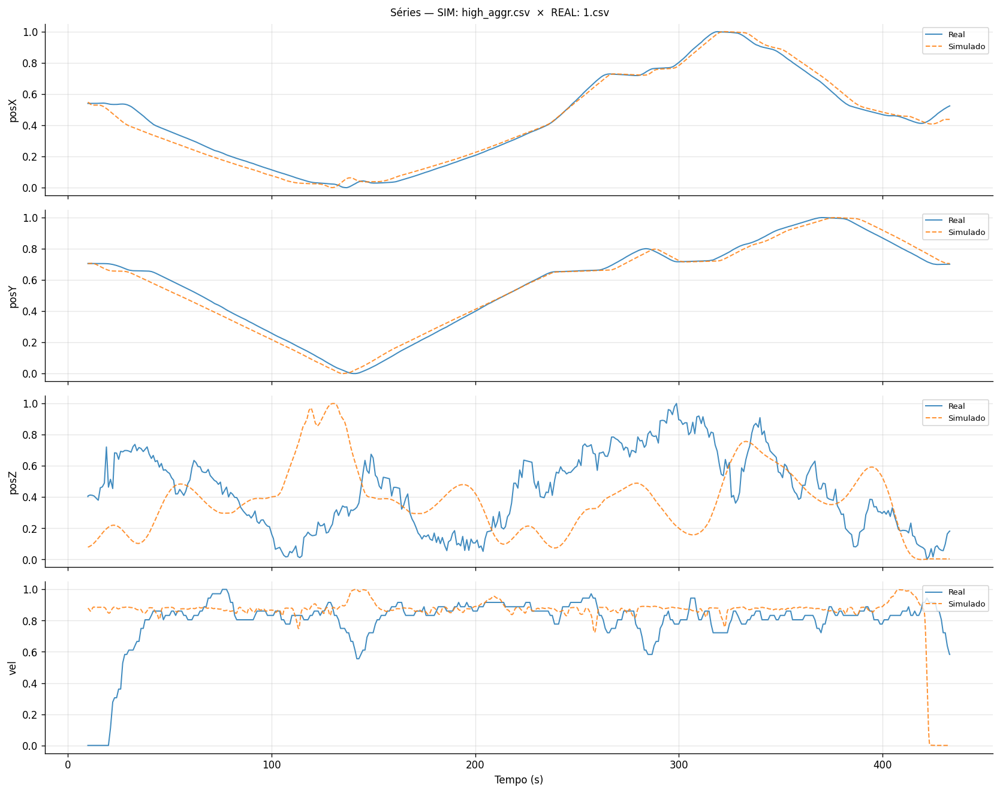

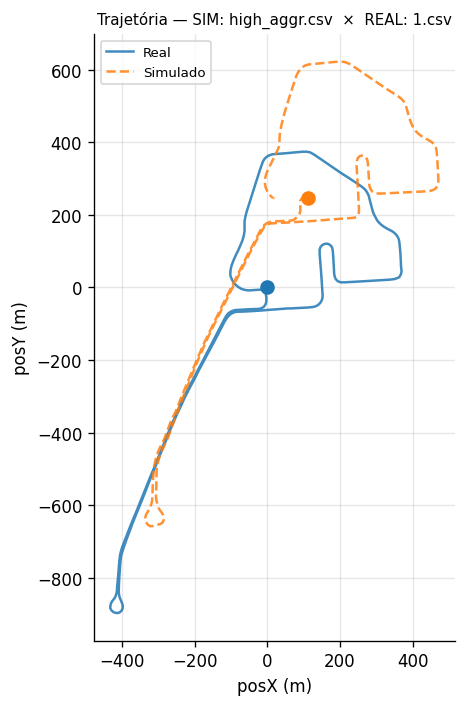

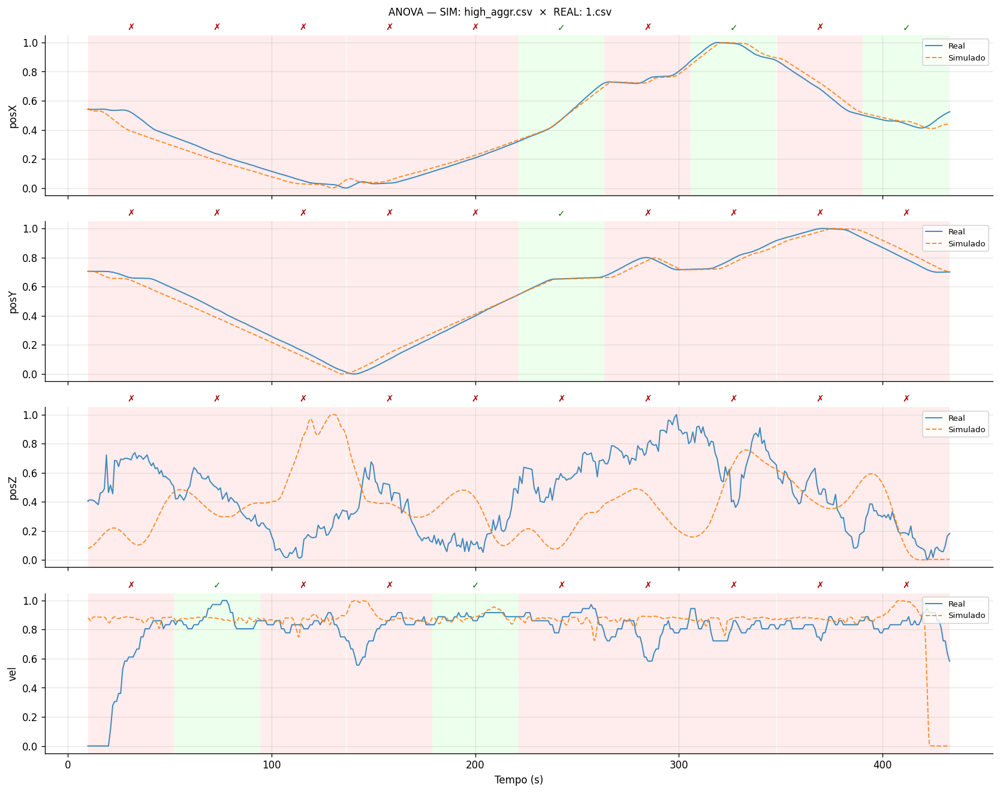

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9922     0.9999          70%  ✗ Divergente
    posY           0.9927     1.0000          90%  ✗ Divergente
    posZ          -0.0982     0.9983         100%  ✗ Divergente
    vel           -0.0427     0.9971          80%  ✗ Divergente

  ── SIM: high_aggr.csv  ×  REAL: 10.csv
    Amostras: 4036 | Lags: {'posZ': 0, 'vel': 0, 'posX': -94, 'posY': -36}


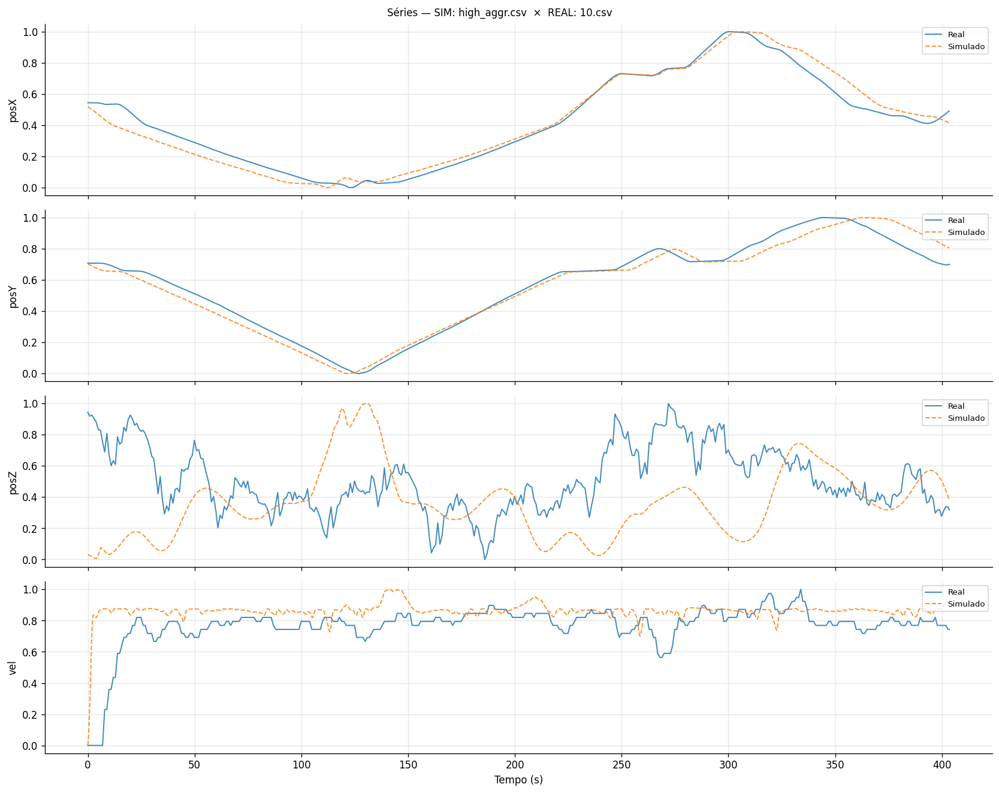

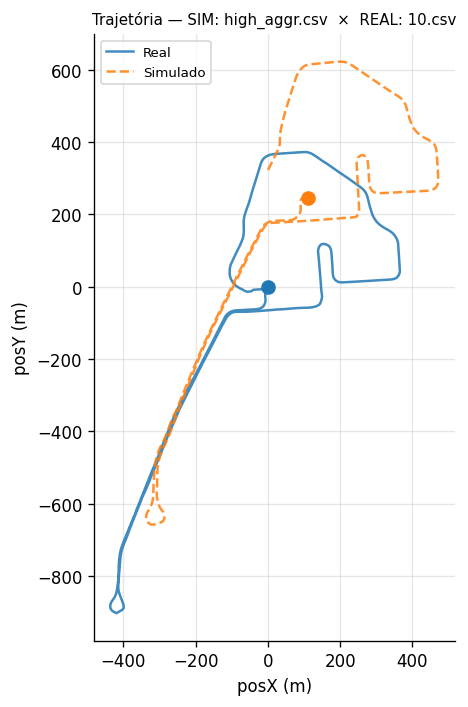

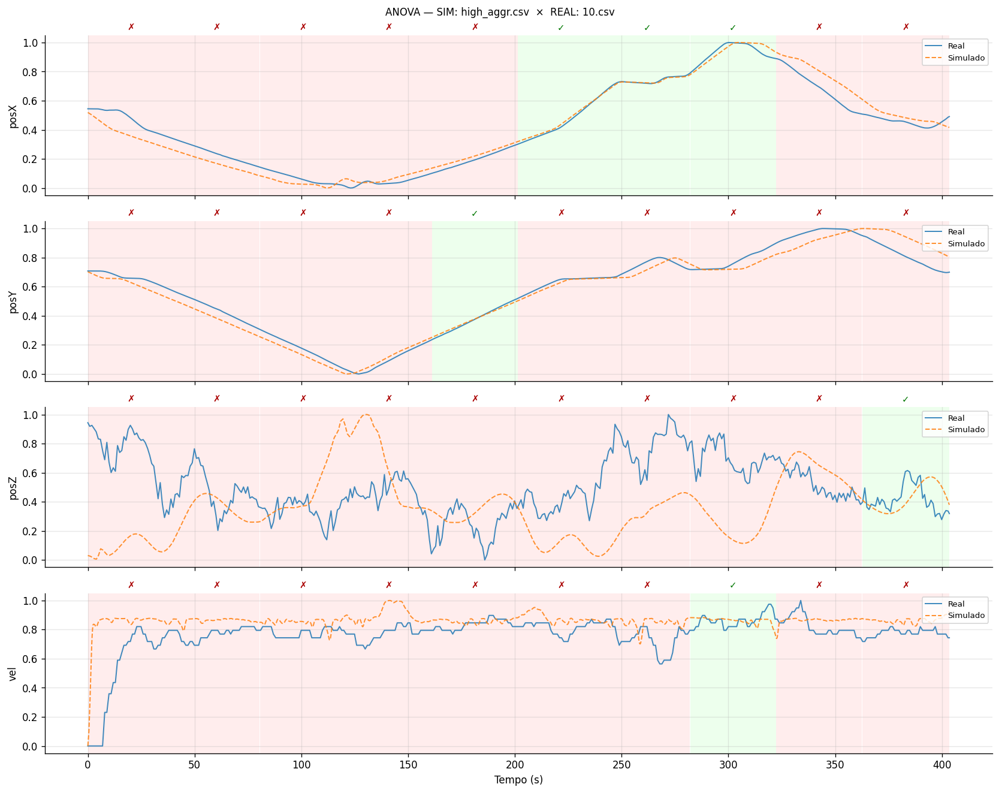

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9820     0.9999          70%  ✗ Divergente
    posY           0.9813     0.9997          90%  ✗ Divergente
    posZ          -0.2001     0.9966          90%  ✗ Divergente
    vel            0.3352     0.9993          90%  ✗ Divergente

  ── SIM: high_aggr.csv  ×  REAL: 2.csv
    Amostras: 4291 | Lags: {'posZ': 0, 'vel': 0, 'posX': 34, 'posY': 41}


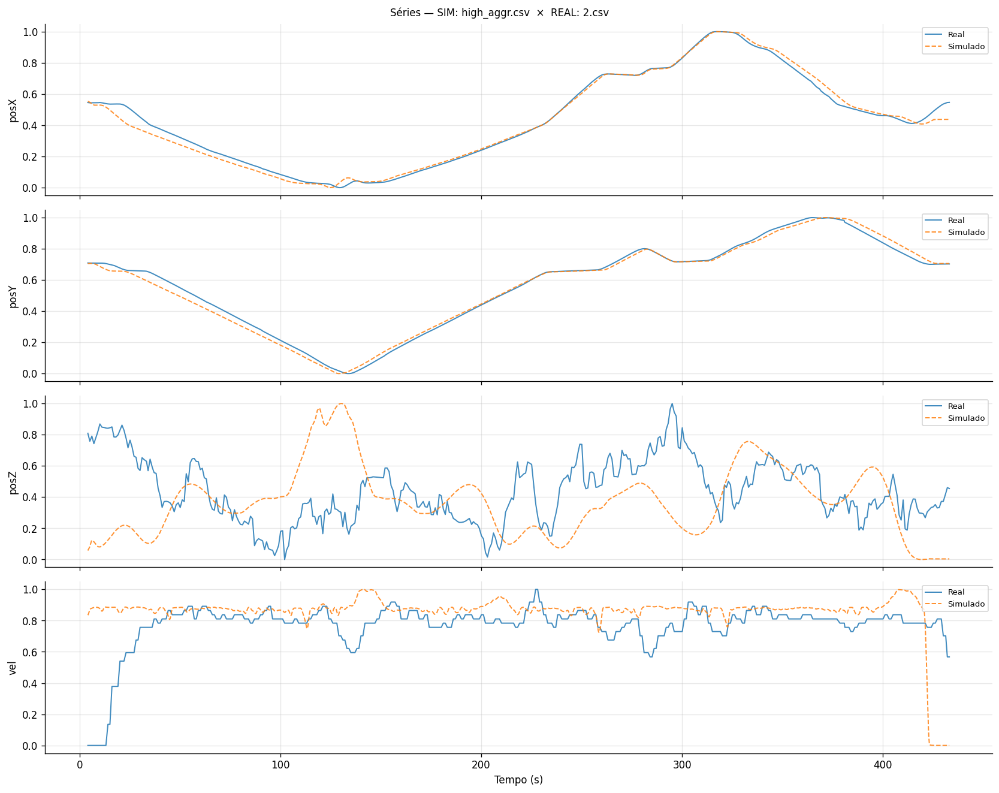

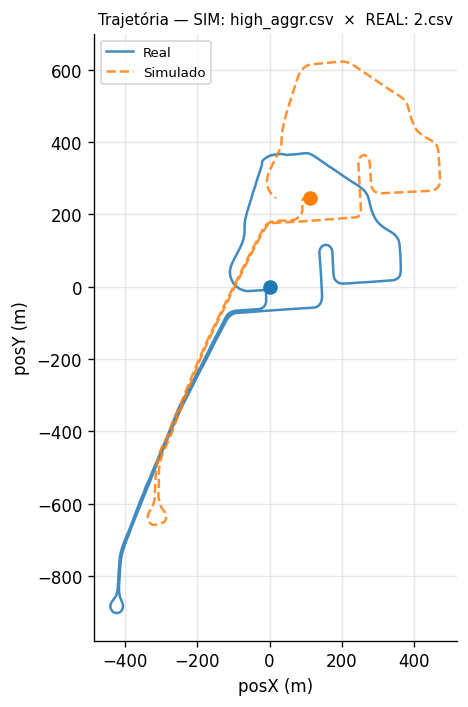

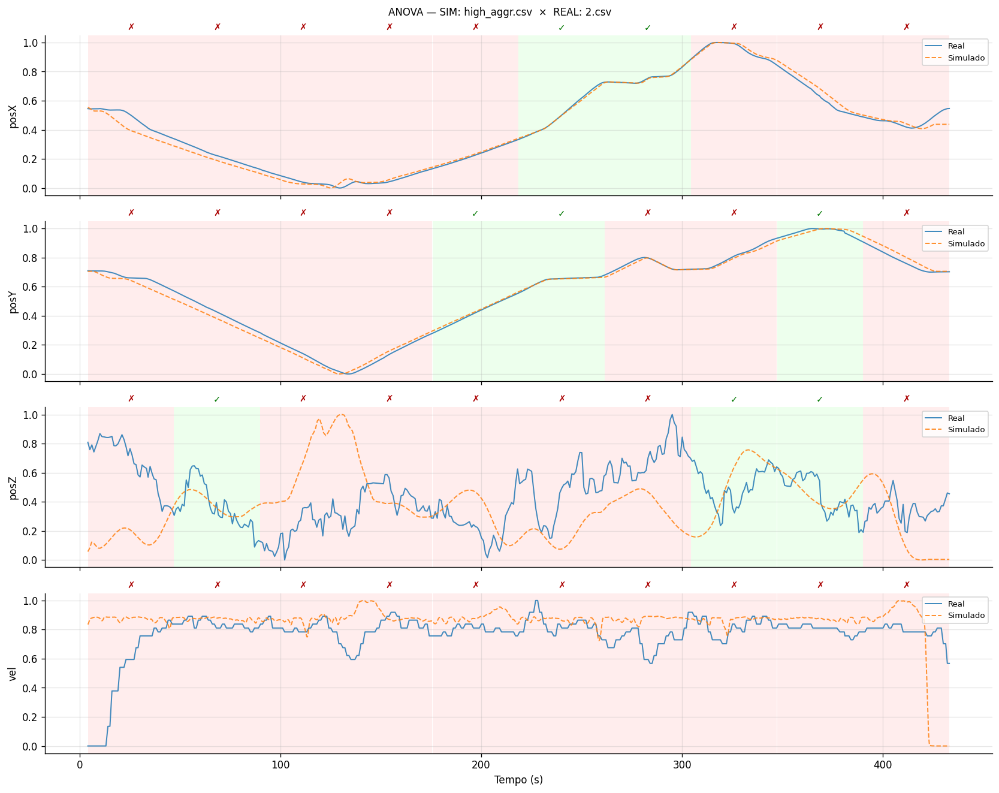

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9943     0.9998          80%  ✗ Divergente
    posY           0.9956     1.0000          70%  ✗ Divergente
    posZ          -0.1759     0.9969          70%  ✗ Divergente
    vel            0.0249     0.9973         100%  ✗ Divergente

  ── SIM: high_aggr.csv  ×  REAL: 3.csv
    Amostras: 4287 | Lags: {'posZ': 0, 'vel': 0, 'posX': 11, 'posY': 12}


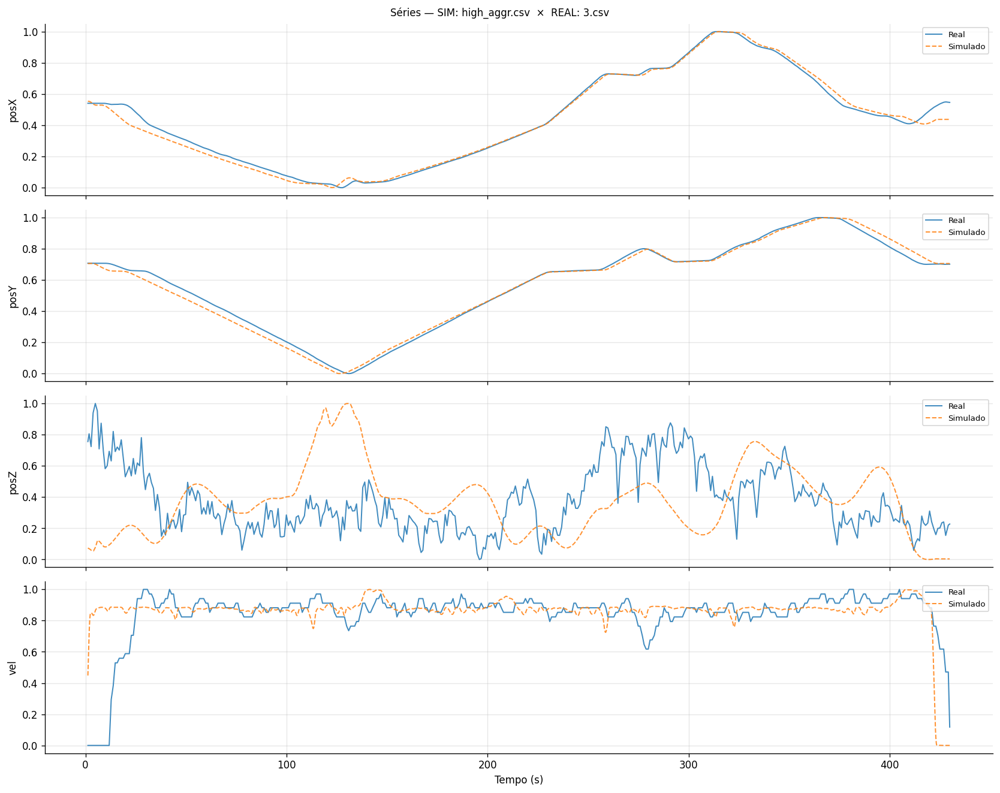

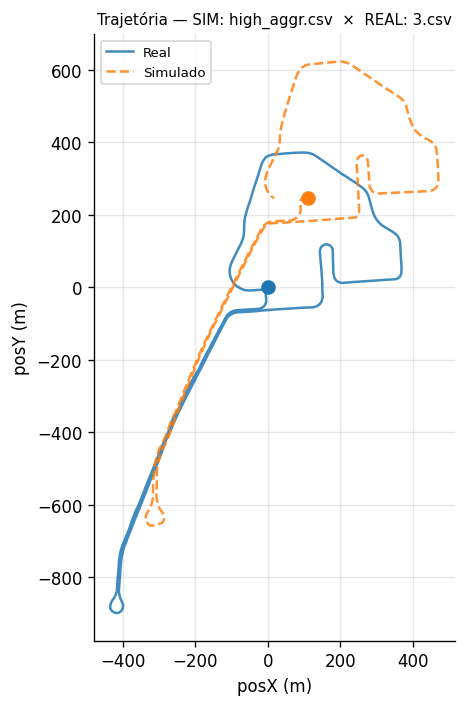

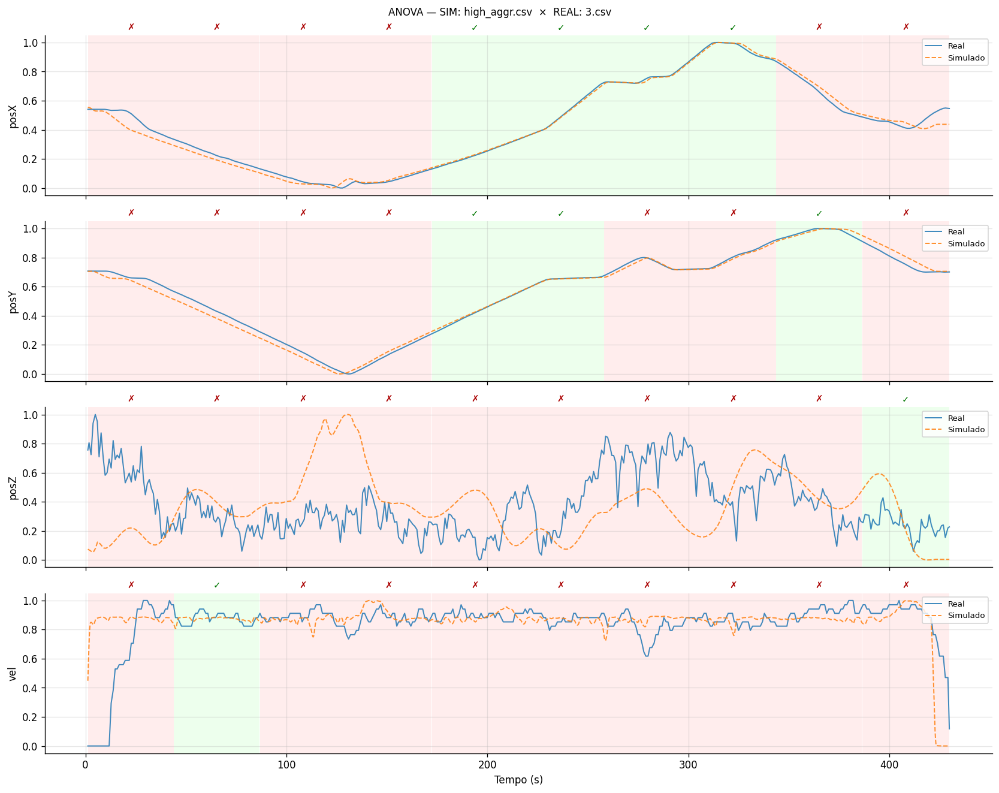

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9945     0.9998          60%  ✗ Divergente
    posY           0.9952     1.0000          70%  ✗ Divergente
    posZ          -0.0489     0.9974          90%  ✗ Divergente
    vel            0.2550     0.9988          90%  ✗ Divergente

  ── SIM: high_aggr.csv  ×  REAL: 4.csv
    Amostras: 4257 | Lags: {'posZ': 0, 'vel': 0, 'posX': -4, 'posY': 0}


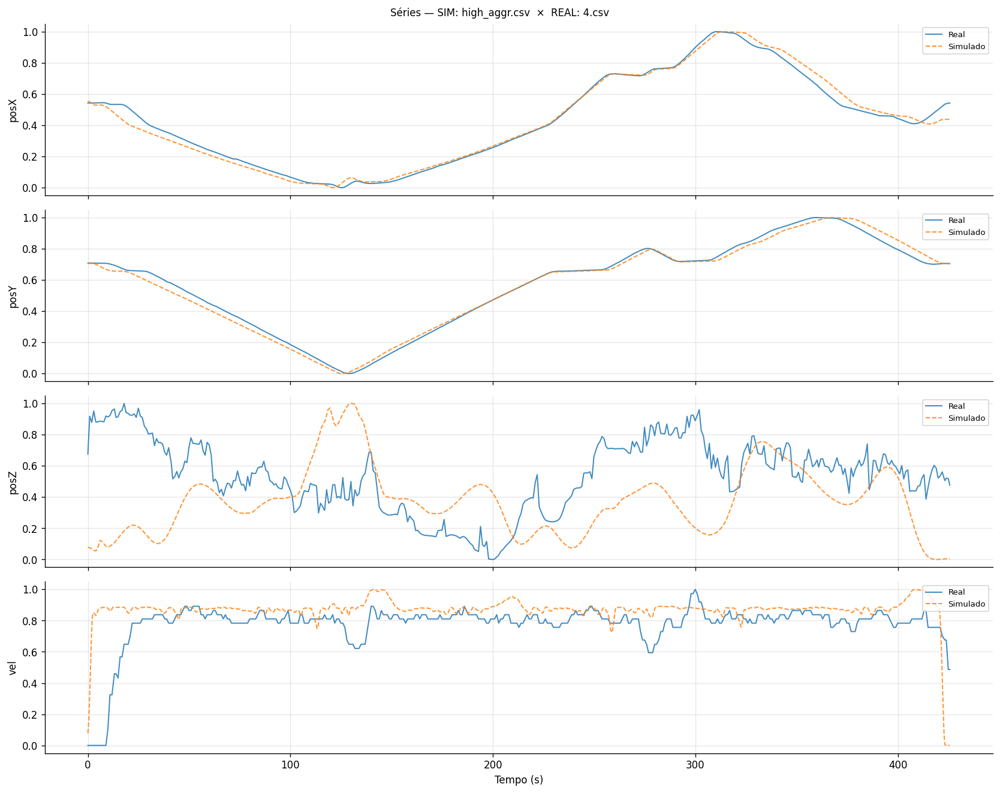

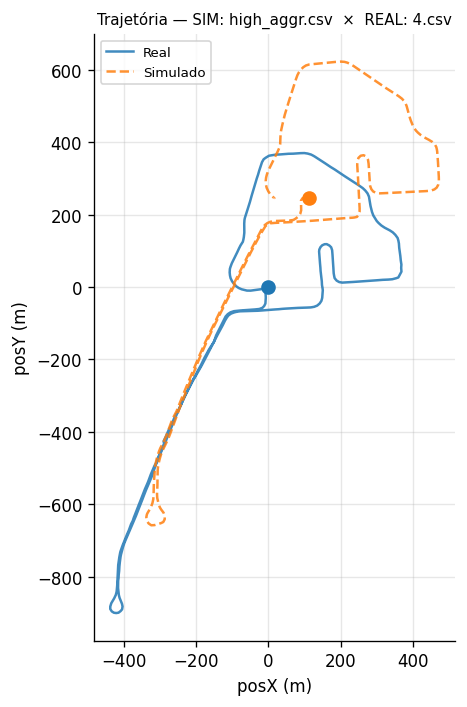

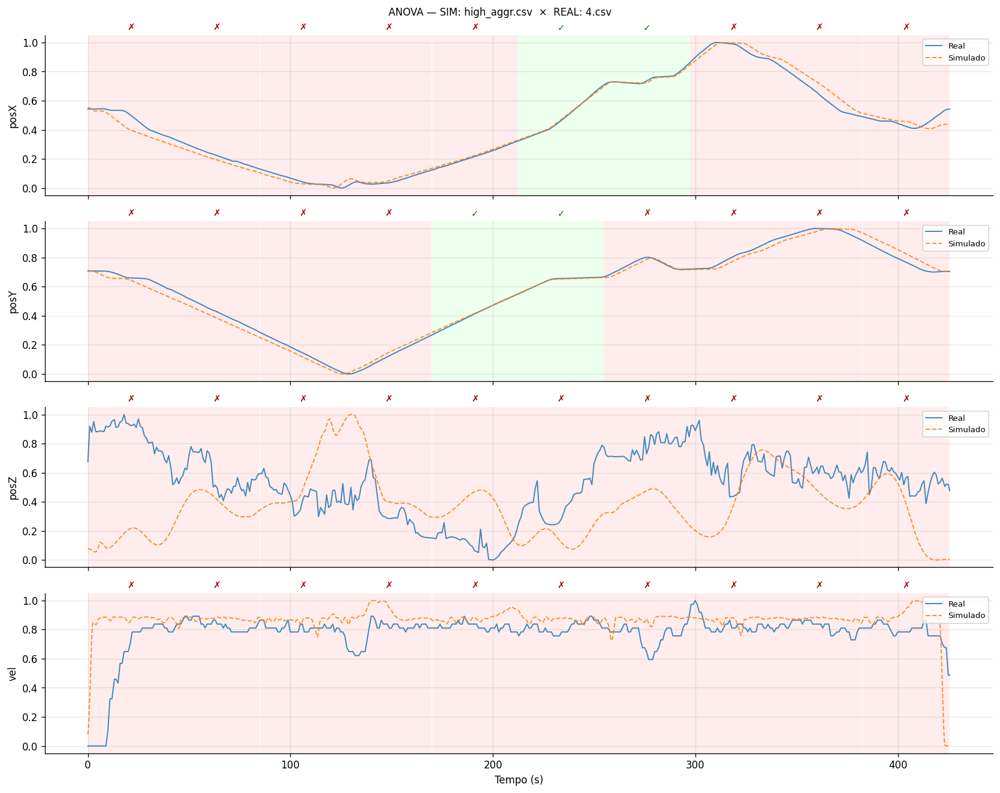

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9930     0.9998          80%  ✗ Divergente
    posY           0.9946     1.0000          80%  ✗ Divergente
    posZ          -0.0863     0.9964         100%  ✗ Divergente
    vel            0.2587     0.9991         100%  ✗ Divergente

  ── SIM: high_aggr.csv  ×  REAL: 5.csv
    Amostras: 4243 | Lags: {'posZ': 0, 'vel': 0, 'posX': -17, 'posY': 0}


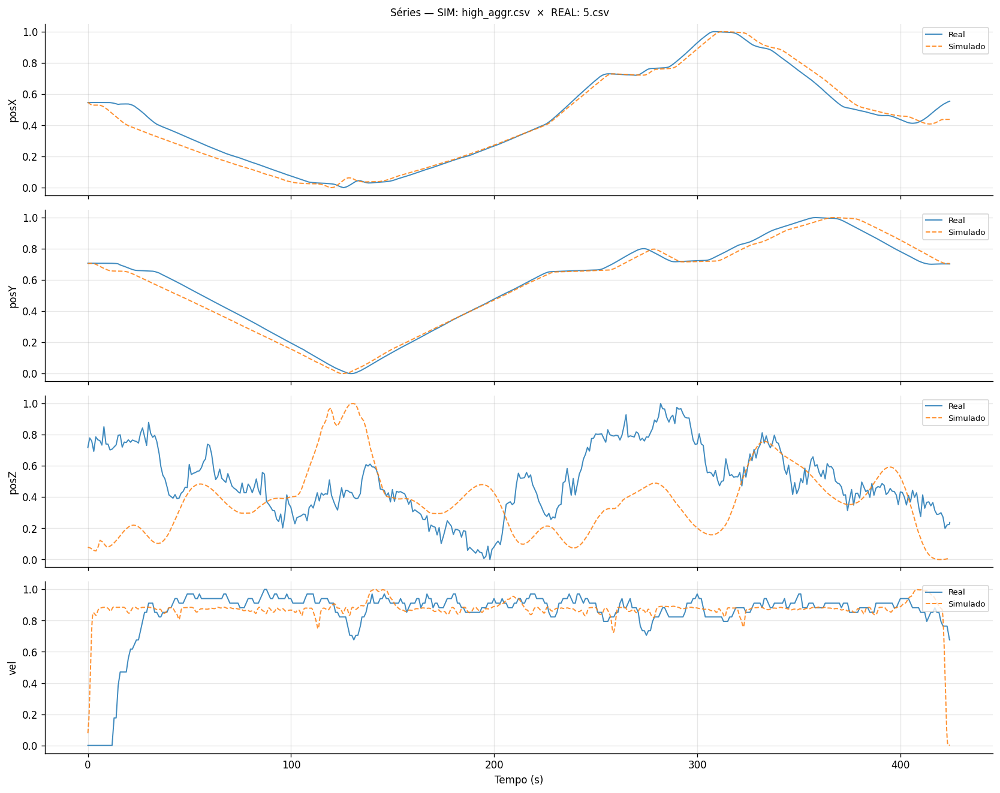

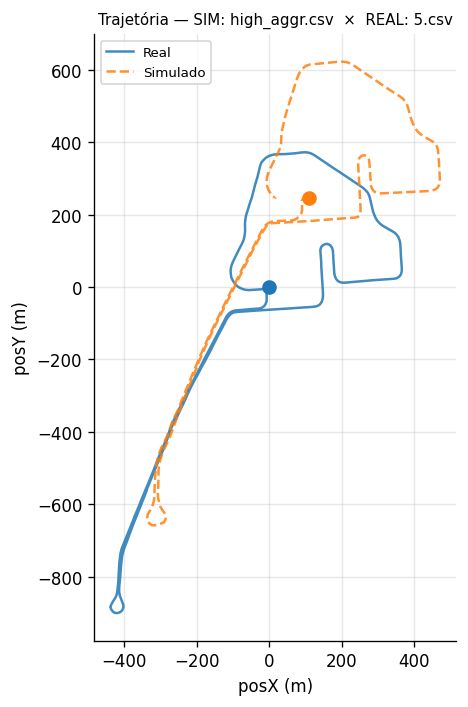

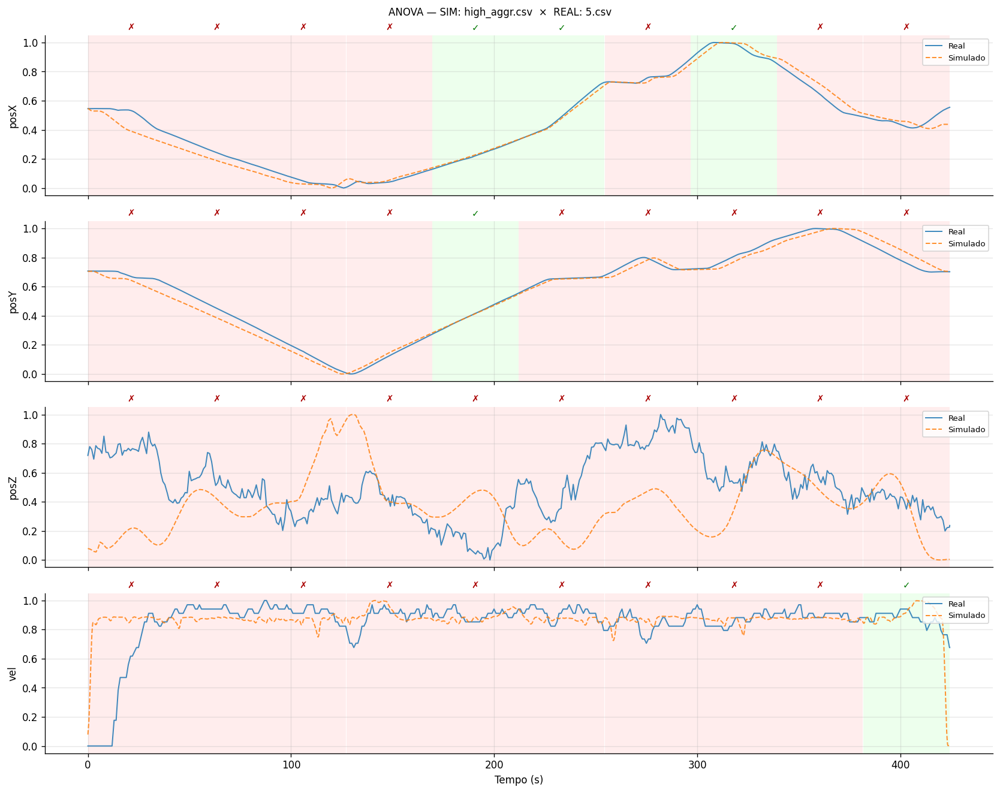

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9892     0.9998          70%  ✗ Divergente
    posY           0.9911     1.0000          90%  ✗ Divergente
    posZ          -0.0515     0.9969         100%  ✗ Divergente
    vel            0.2213     0.9992          90%  ✗ Divergente

  ── SIM: high_aggr.csv  ×  REAL: 6.csv
    Amostras: 4315 | Lags: {'posZ': 0, 'vel': 0, 'posX': 17, 'posY': 0}


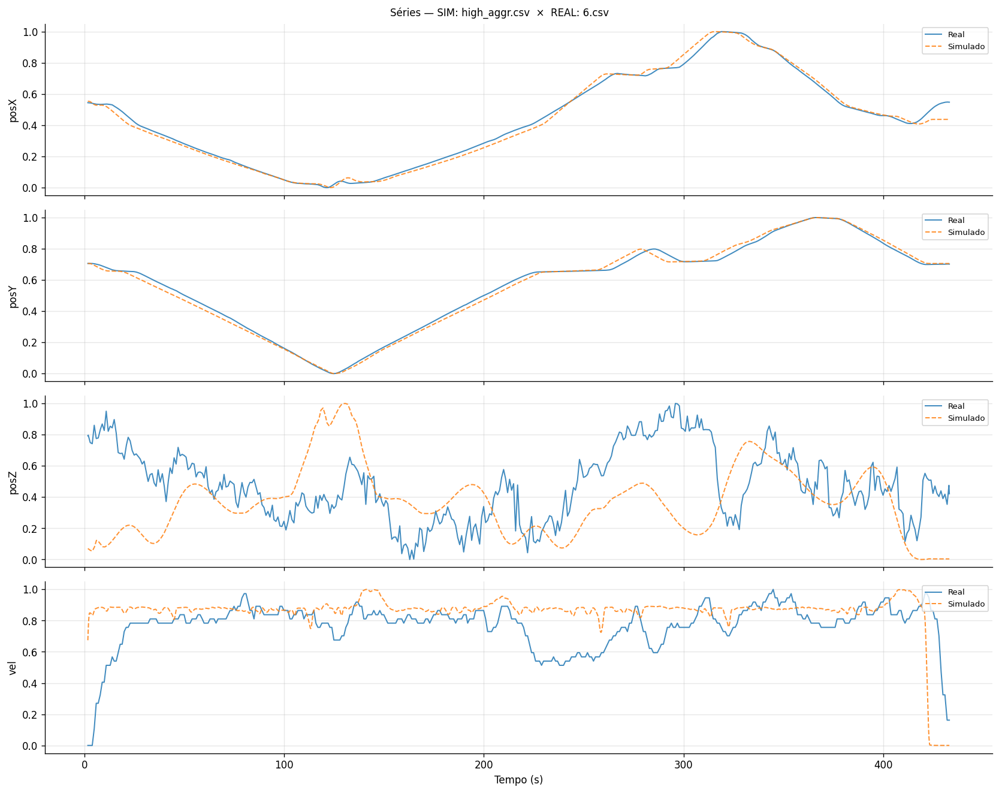

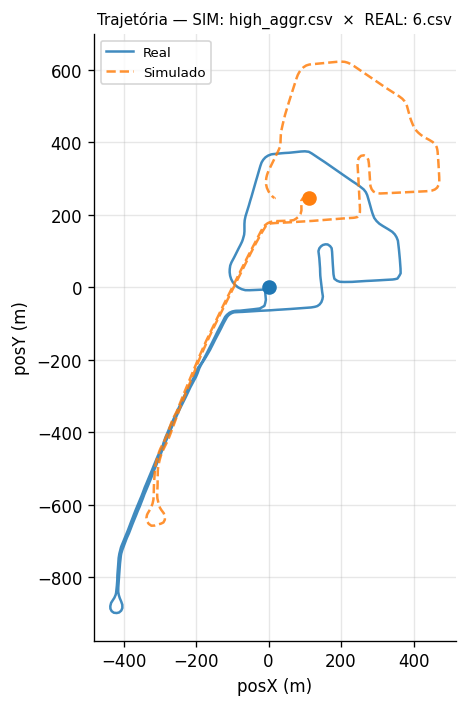

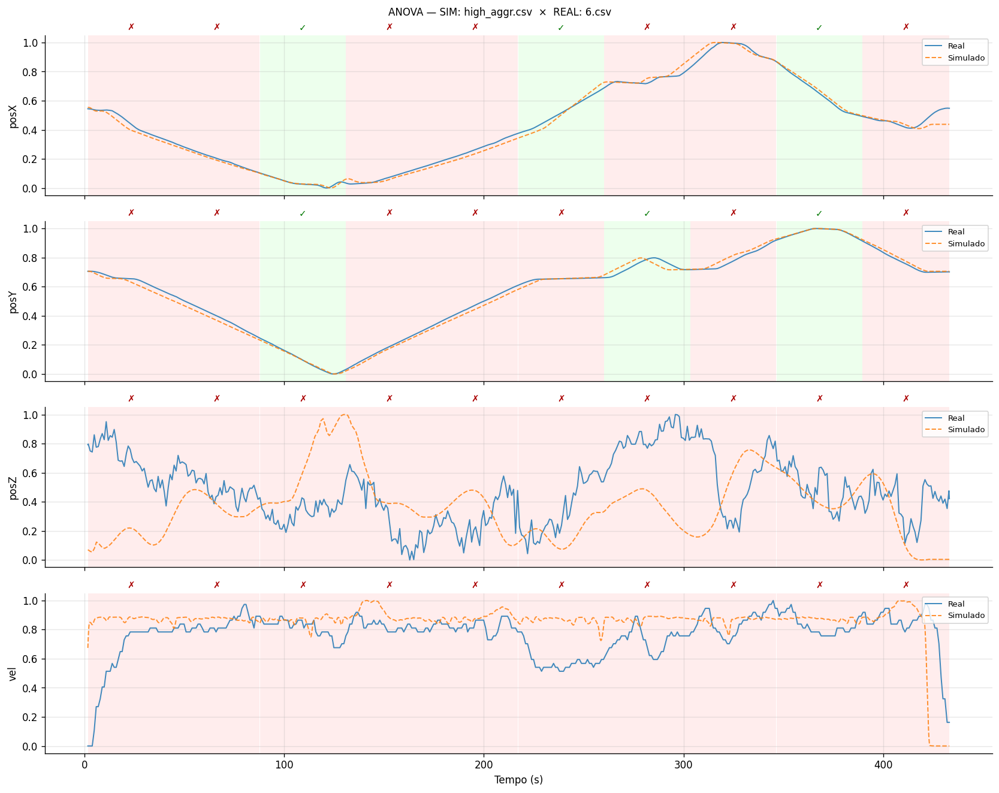

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9964     0.9998          70%  ✗ Divergente
    posY           0.9975     1.0000          70%  ✗ Divergente
    posZ          -0.0242     0.9968         100%  ✗ Divergente
    vel            0.2203     0.9985         100%  ✗ Divergente

  ── SIM: high_aggr.csv  ×  REAL: 7.csv
    Amostras: 4056 | Lags: {'posZ': 0, 'vel': 0, 'posX': -114, 'posY': -72}


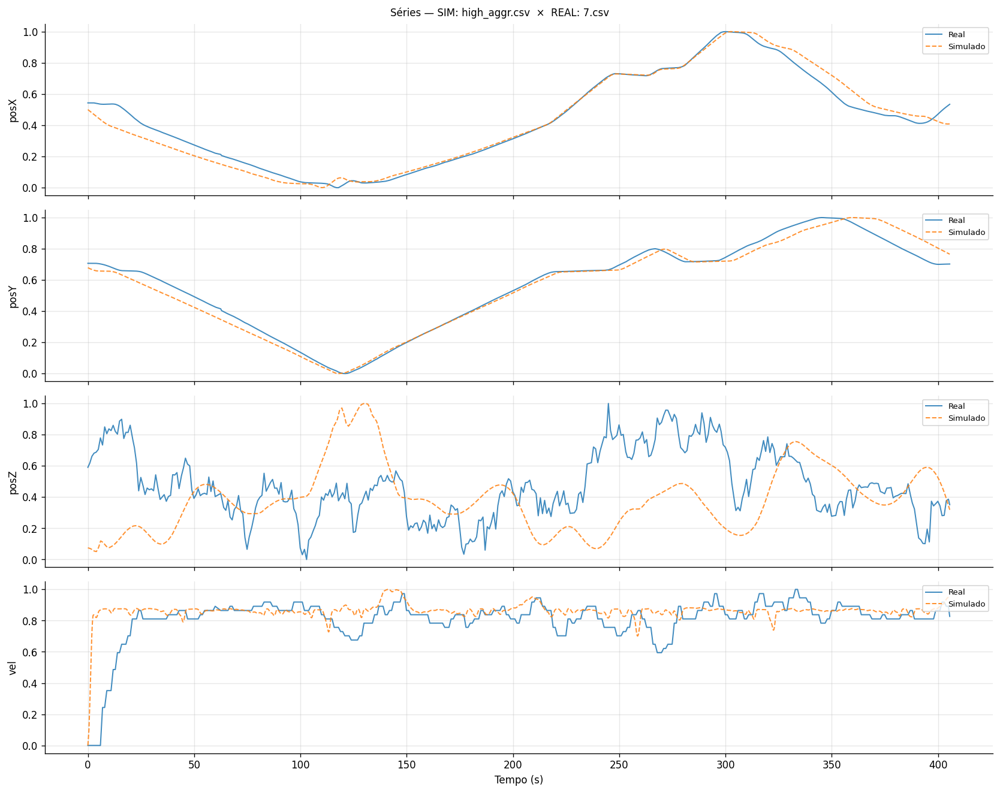

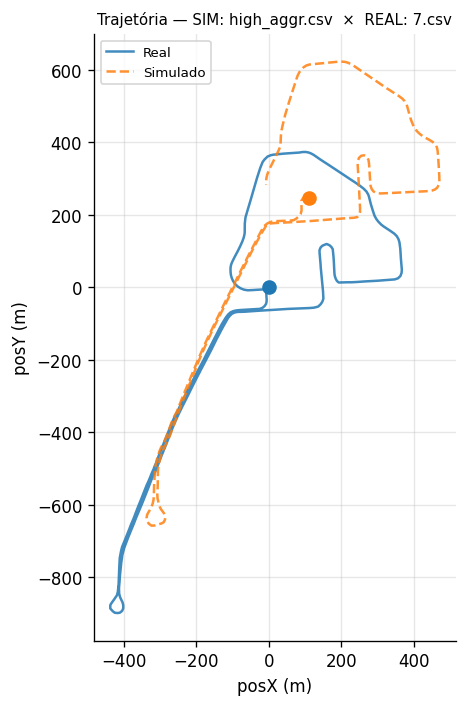

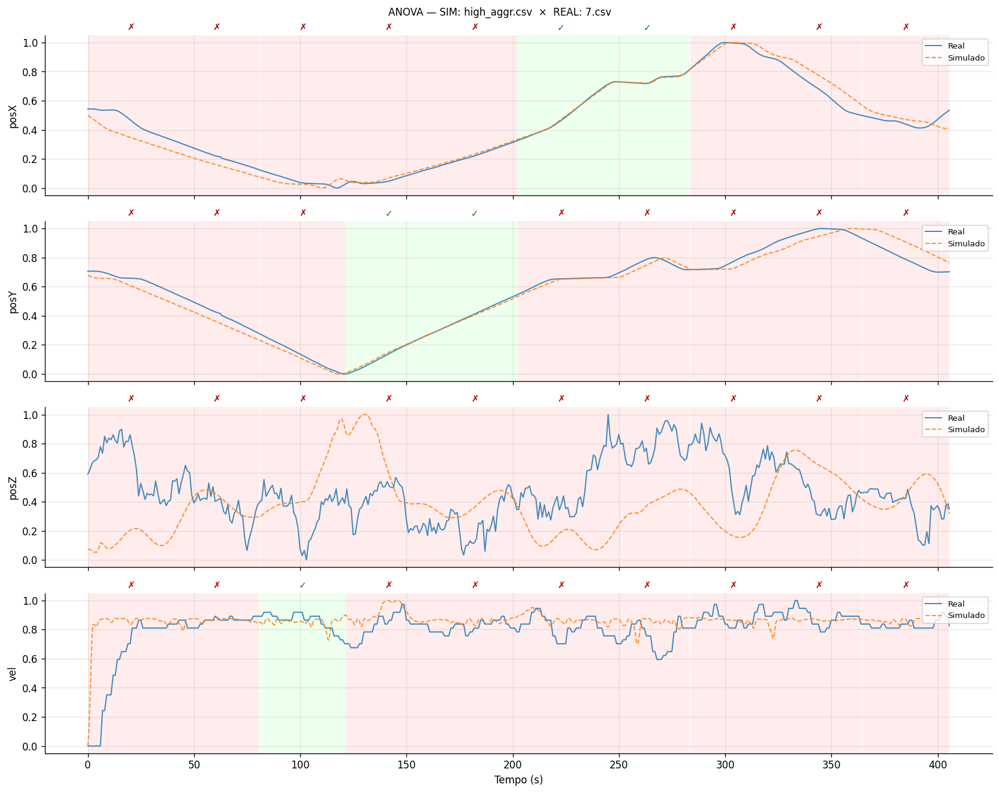

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9853     0.9998          80%  ✗ Divergente
    posY           0.9858     0.9998          80%  ✗ Divergente
    posZ          -0.1962     0.9971         100%  ✗ Divergente
    vel            0.3777     0.9995          90%  ✗ Divergente

  ── SIM: high_aggr.csv  ×  REAL: 8.csv
    Amostras: 4164 | Lags: {'posZ': 0, 'vel': 0, 'posX': -46, 'posY': -9}


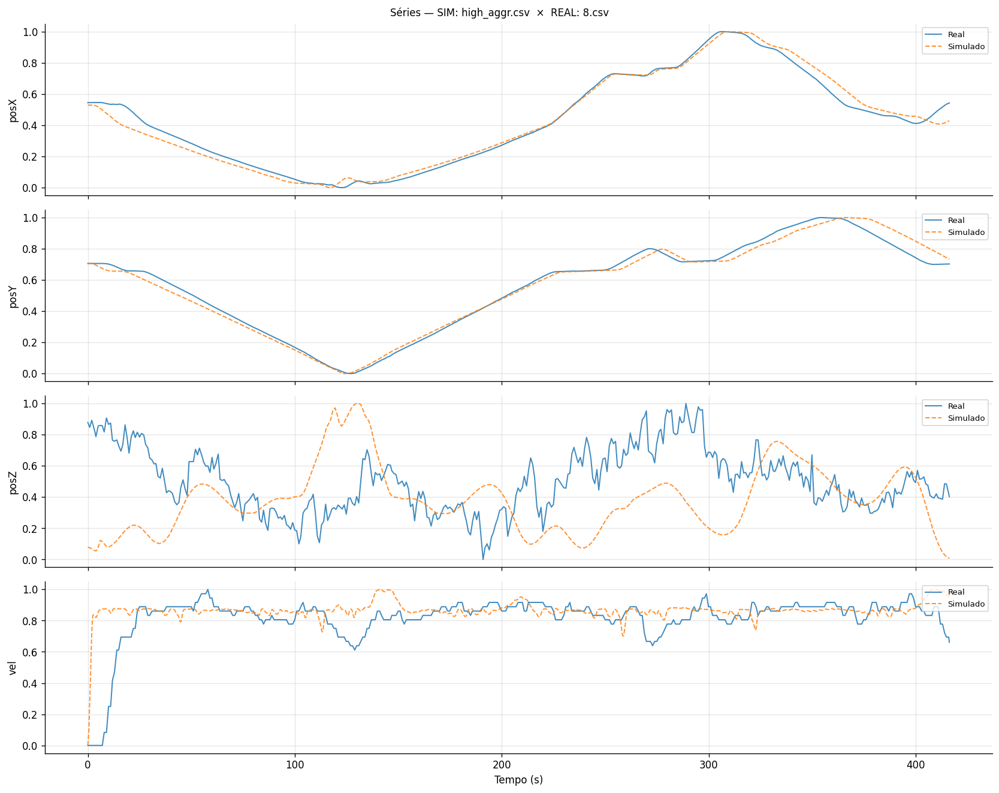

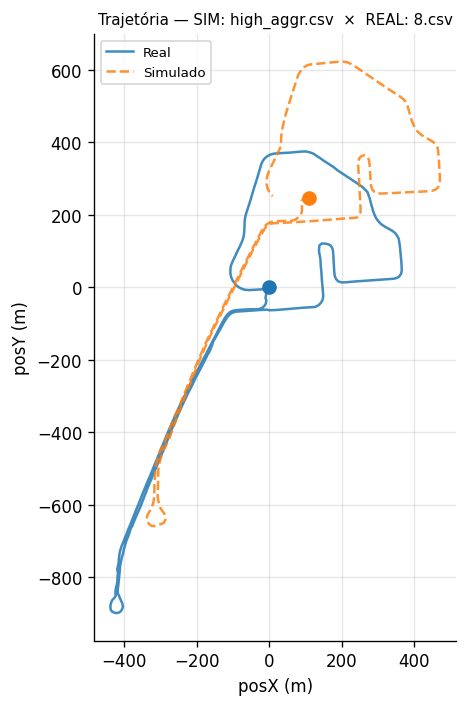

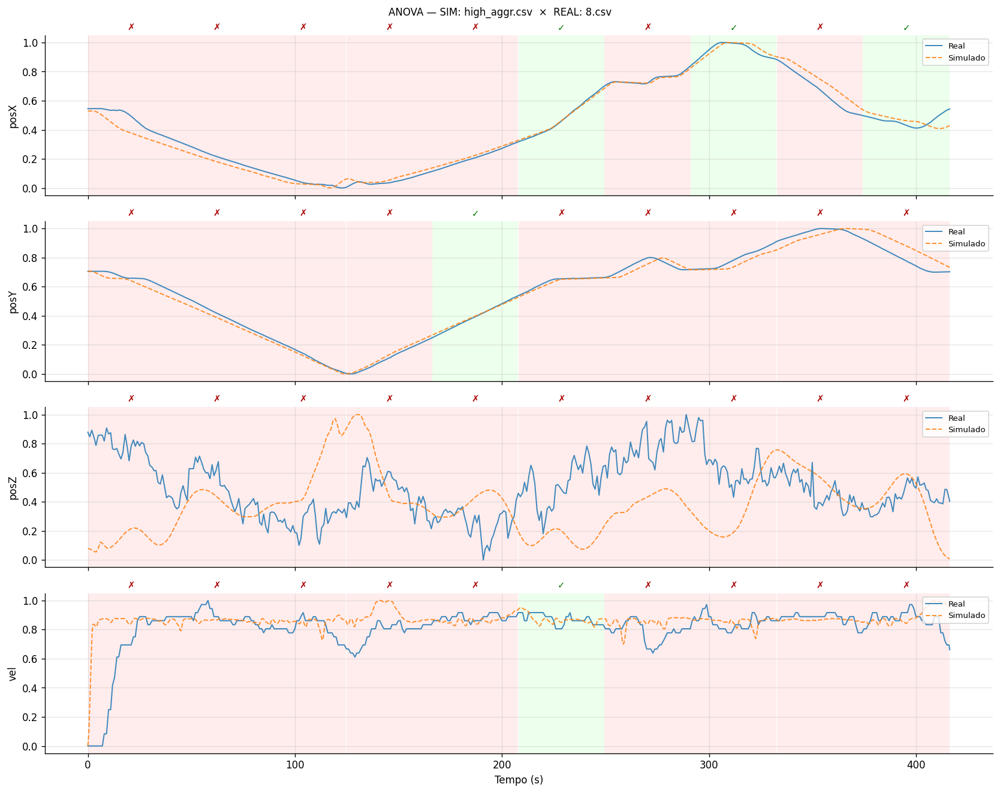

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9902     0.9998          70%  ✗ Divergente
    posY           0.9903     0.9999          90%  ✗ Divergente
    posZ          -0.2052     0.9967         100%  ✗ Divergente
    vel            0.2875     0.9994          90%  ✗ Divergente

  ── SIM: high_aggr.csv  ×  REAL: 9.csv
    Amostras: 4060 | Lags: {'posZ': 0, 'vel': 0, 'posX': -100, 'posY': -49}


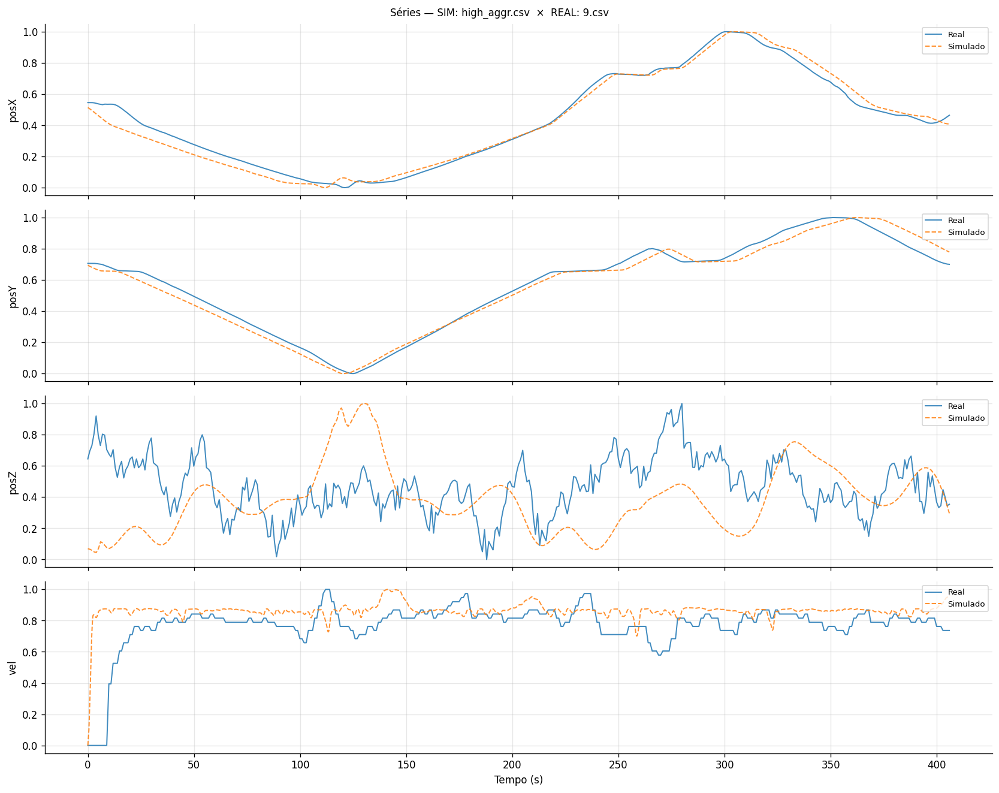

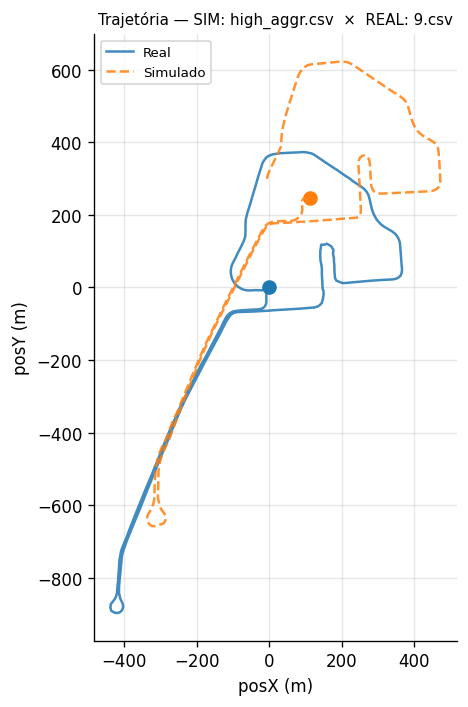

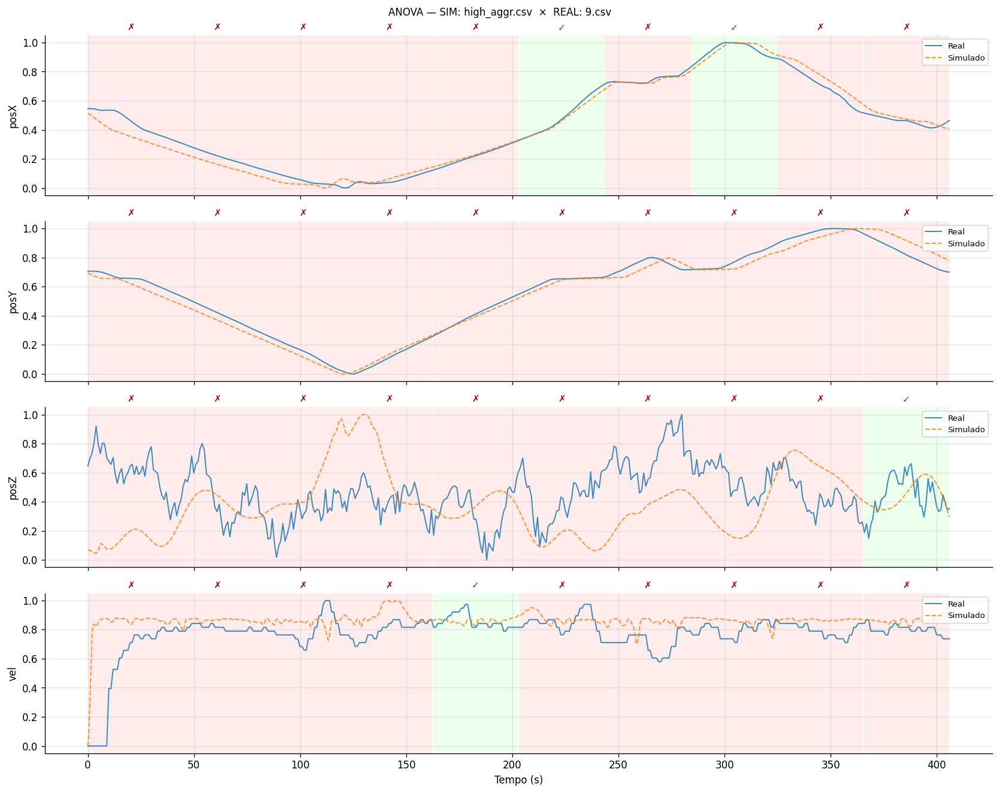

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9892     0.9999          80%  ✗ Divergente
    posY           0.9885     0.9998         100%  ✗ Divergente
    posZ          -0.1058     0.9972          90%  ✗ Divergente
    vel            0.3182     0.9994          90%  ✗ Divergente

██████████████████████████████████████████████████████████████████████
SIMULADO: low_aggr.csv
██████████████████████████████████████████████████████████████████████

  ── SIM: low_aggr.csv  ×  REAL: 1.csv
    Amostras: 4402 | Lags: {'posZ': 0, 'vel': 0, 'posX': -26, 'posY': 2}


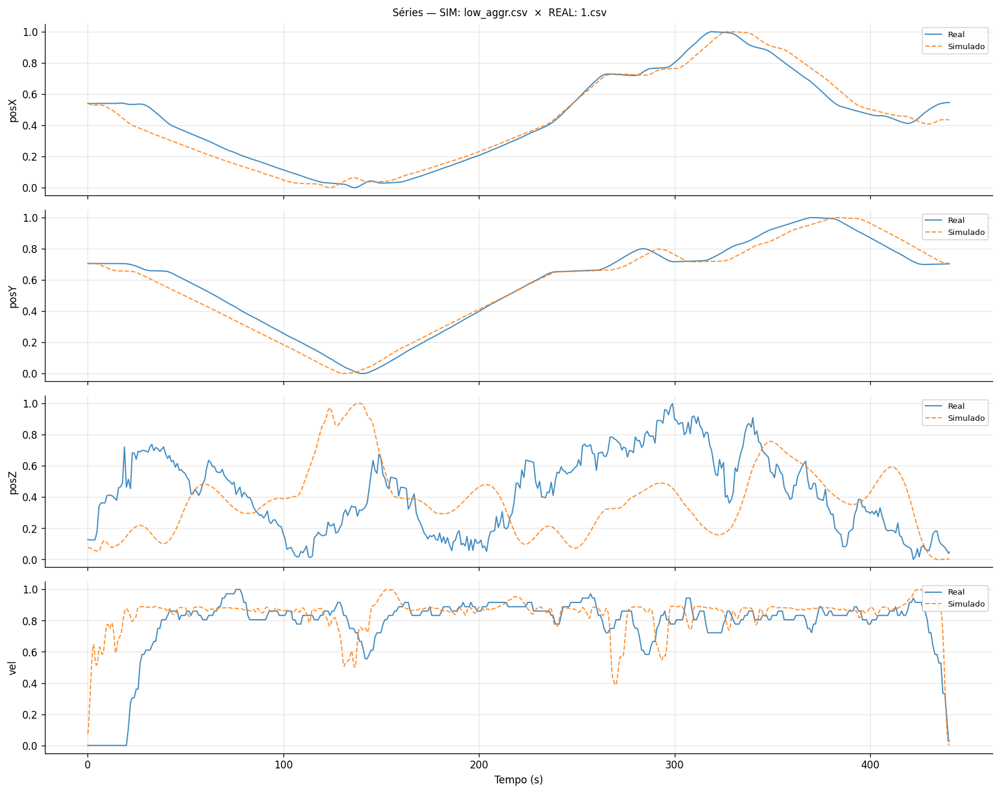

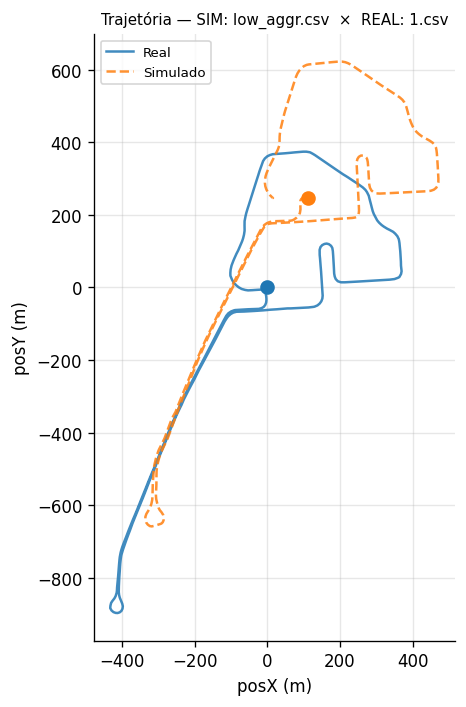

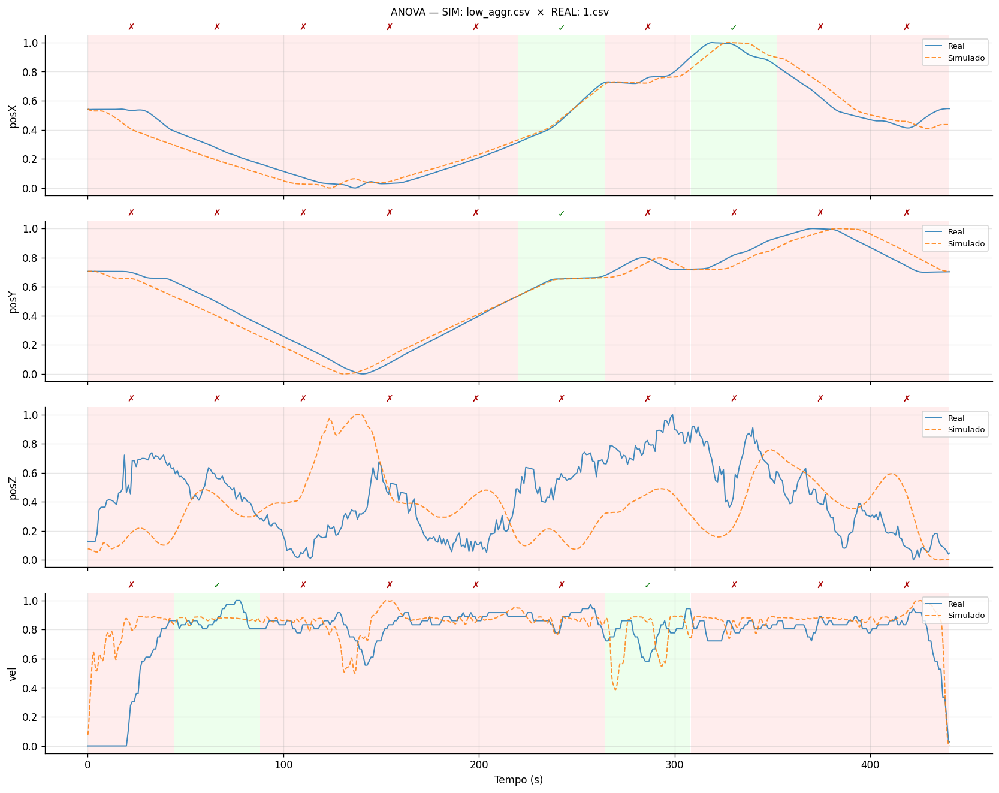

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9793     0.9998          80%  ✗ Divergente
    posY           0.9815     1.0000          90%  ✗ Divergente
    posZ          -0.0886     0.9987         100%  ✗ Divergente
    vel            0.4737     0.9994          80%  ✗ Divergente

  ── SIM: low_aggr.csv  ×  REAL: 10.csv
    Amostras: 3912 | Lags: {'posZ': 0, 'vel': 0, 'posX': -218, 'posY': -128}


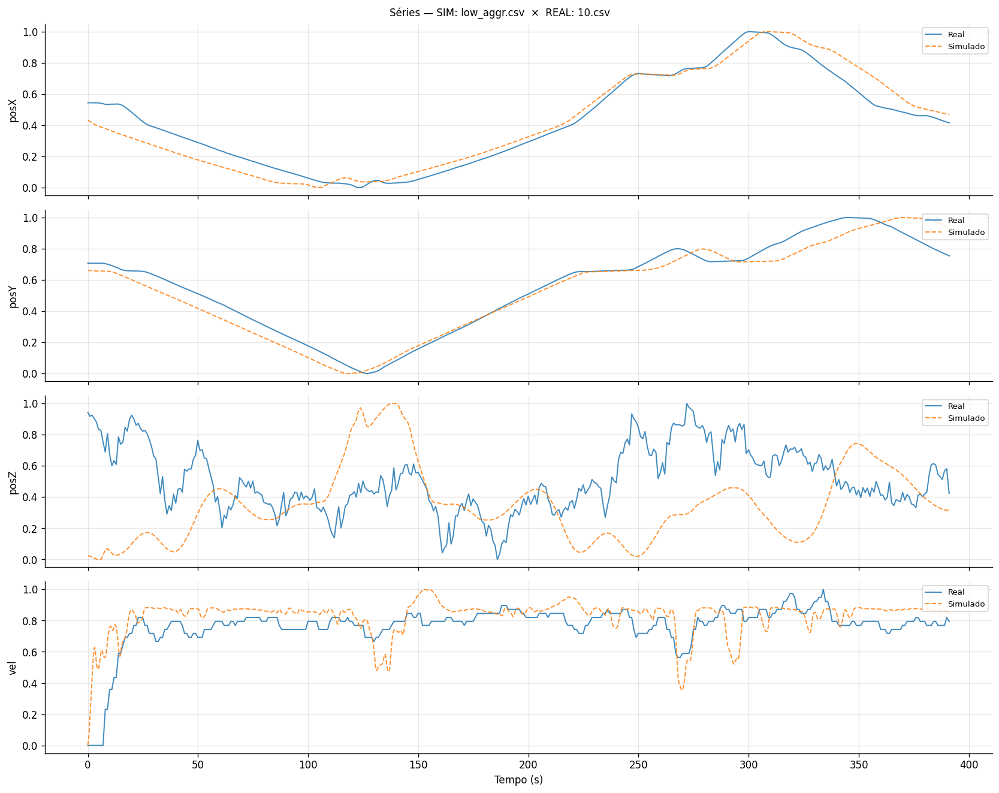

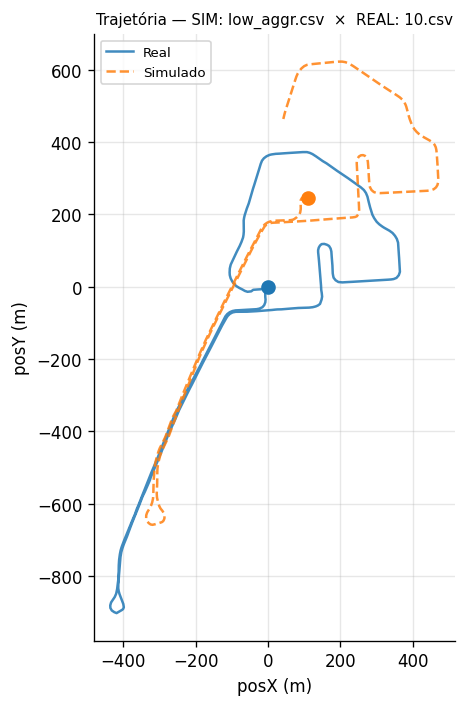

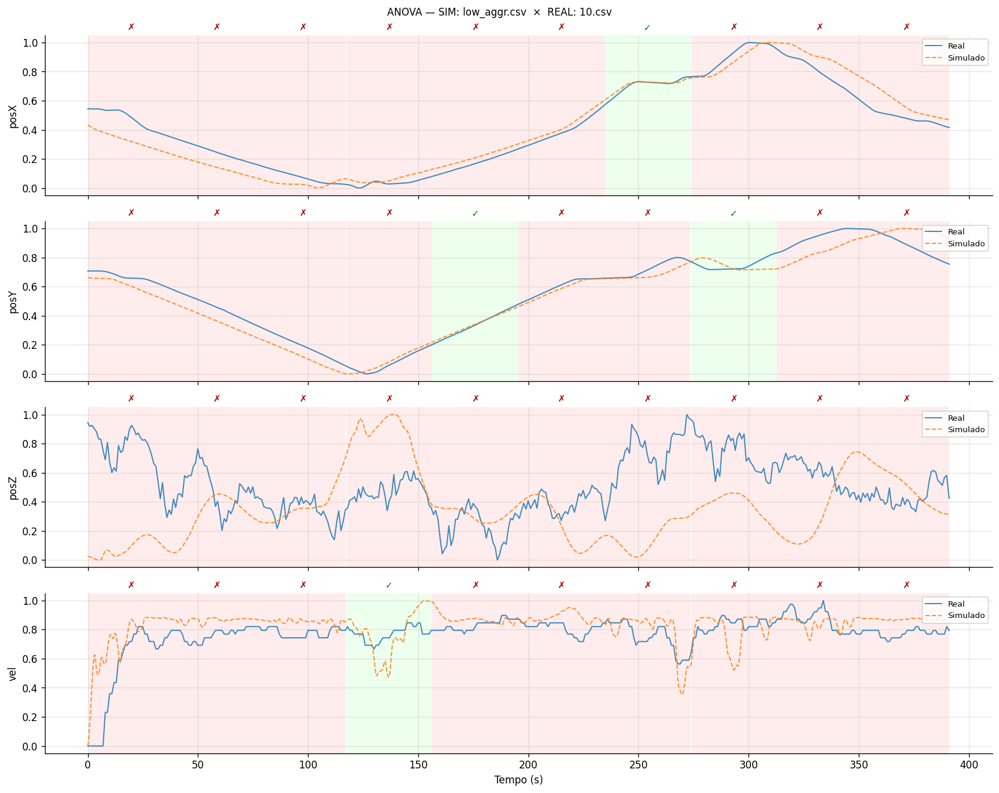

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9660     0.9996          90%  ✗ Divergente
    posY           0.9735     0.9995          80%  ✗ Divergente
    posZ          -0.2714     0.9964         100%  ✗ Divergente
    vel            0.5699     0.9991          90%  ✗ Divergente

  ── SIM: low_aggr.csv  ×  REAL: 2.csv
    Amostras: 4286 | Lags: {'posZ': 0, 'vel': 0, 'posX': -76, 'posY': -24}


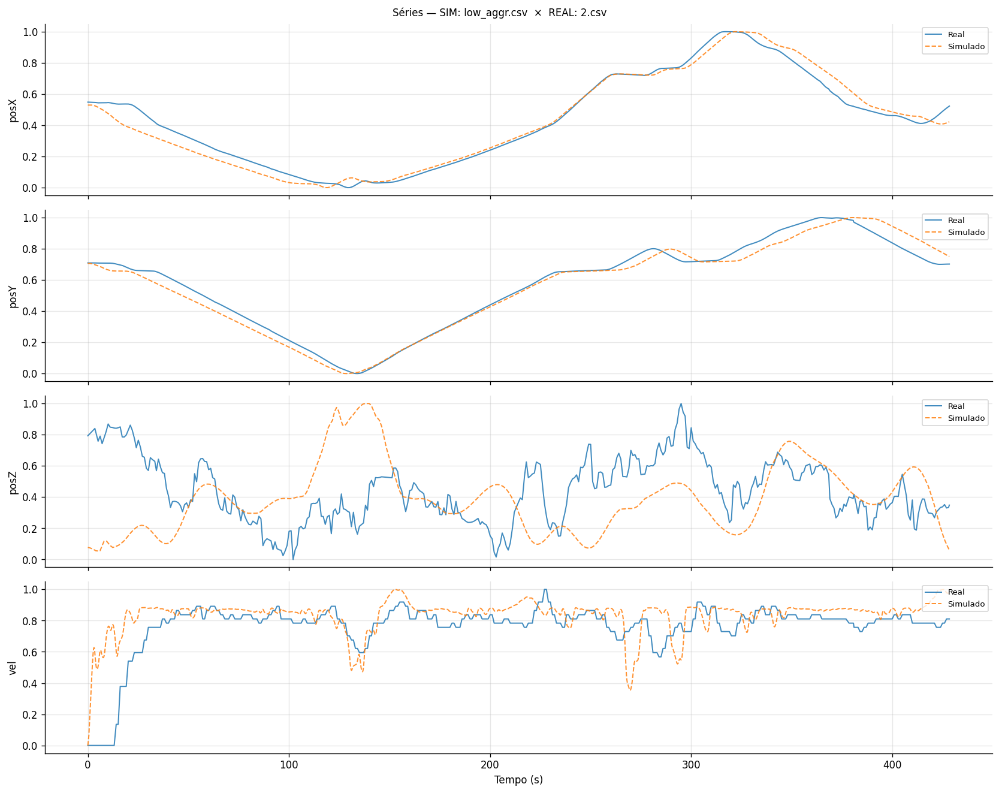

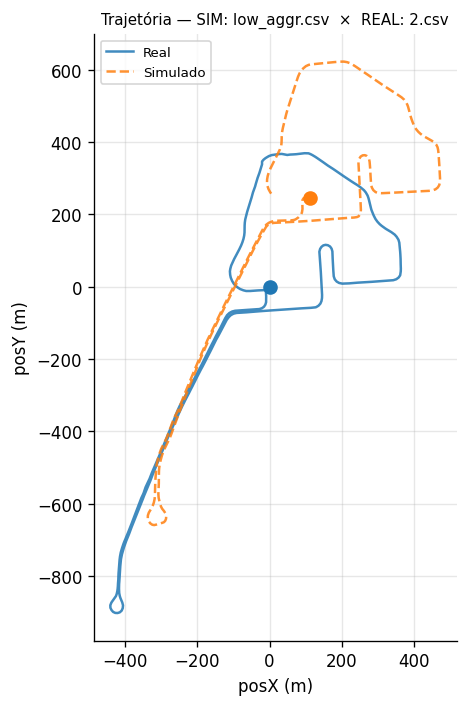

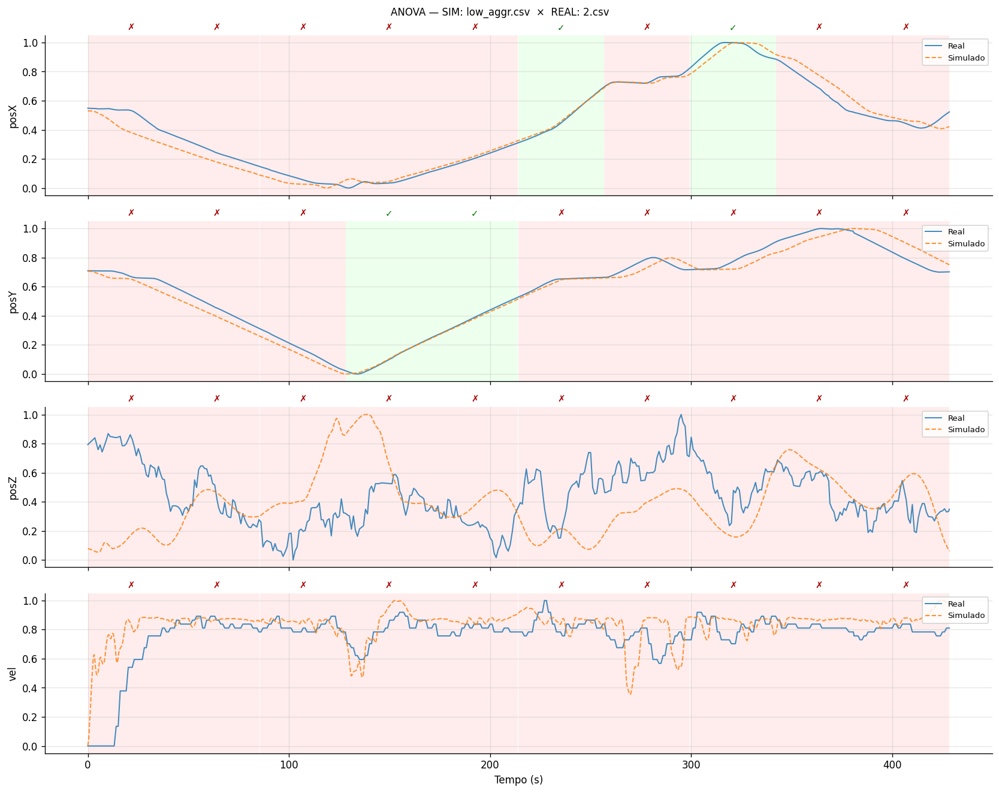

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9845     0.9999          80%  ✗ Divergente
    posY           0.9861     0.9999          80%  ✗ Divergente
    posZ          -0.1777     0.9967         100%  ✗ Divergente
    vel            0.5349     0.9993         100%  ✗ Divergente

  ── SIM: low_aggr.csv  ×  REAL: 3.csv
    Amostras: 4201 | Lags: {'posZ': 0, 'vel': 0, 'posX': -98, 'posY': -52}


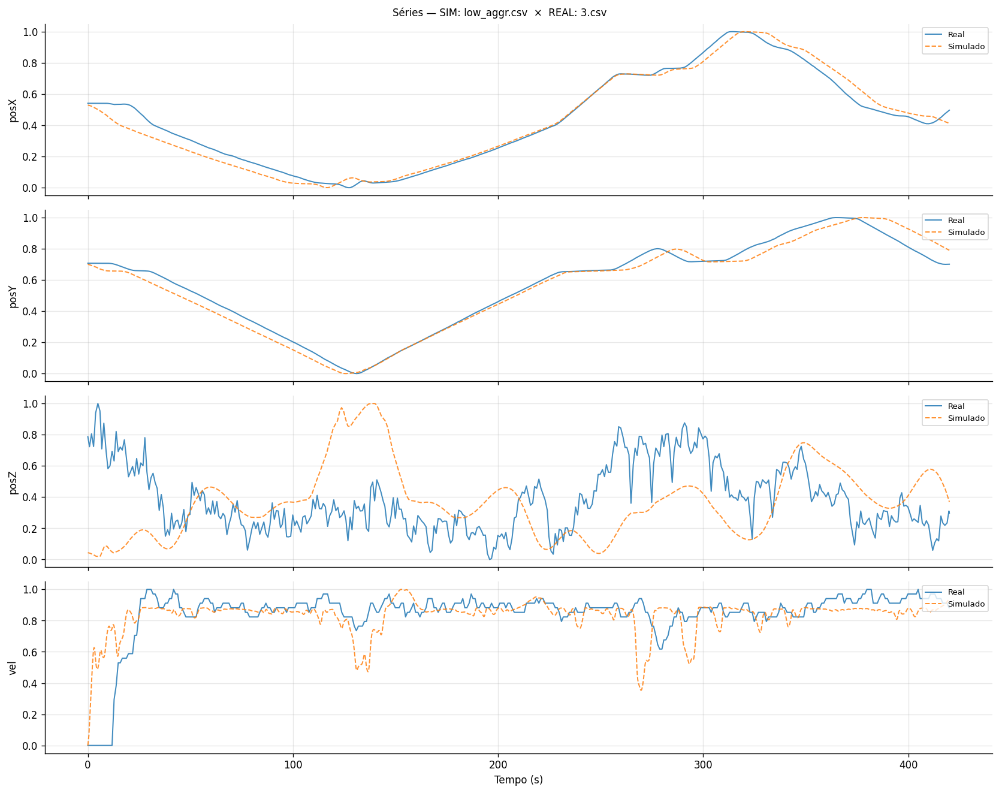

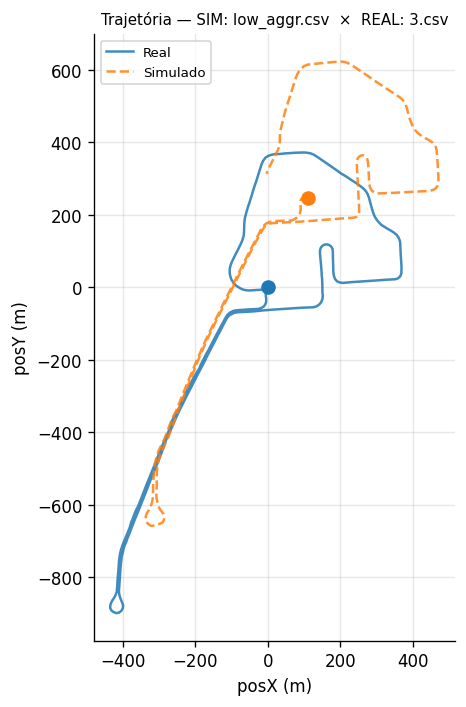

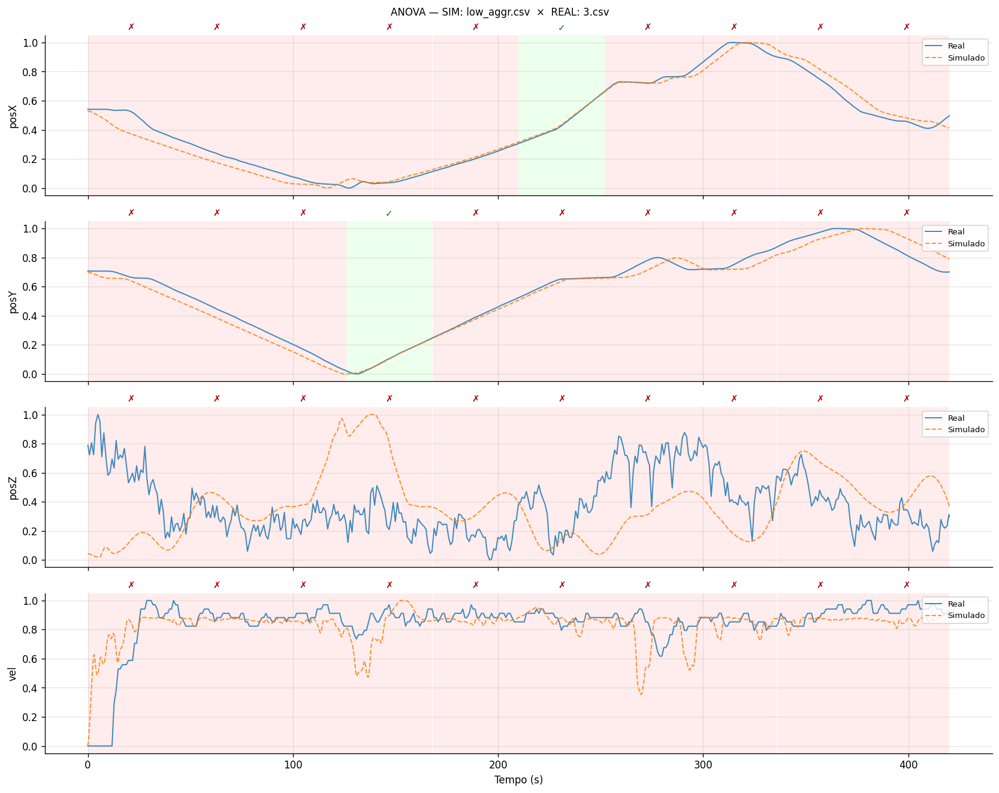

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9861     0.9999          90%  ✗ Divergente
    posY           0.9858     0.9998          90%  ✗ Divergente
    posZ          -0.1492     0.9970         100%  ✗ Divergente
    vel            0.5123     0.9992         100%  ✗ Divergente

  ── SIM: low_aggr.csv  ×  REAL: 4.csv
    Amostras: 4138 | Lags: {'posZ': 0, 'vel': 0, 'posX': -123, 'posY': -74}


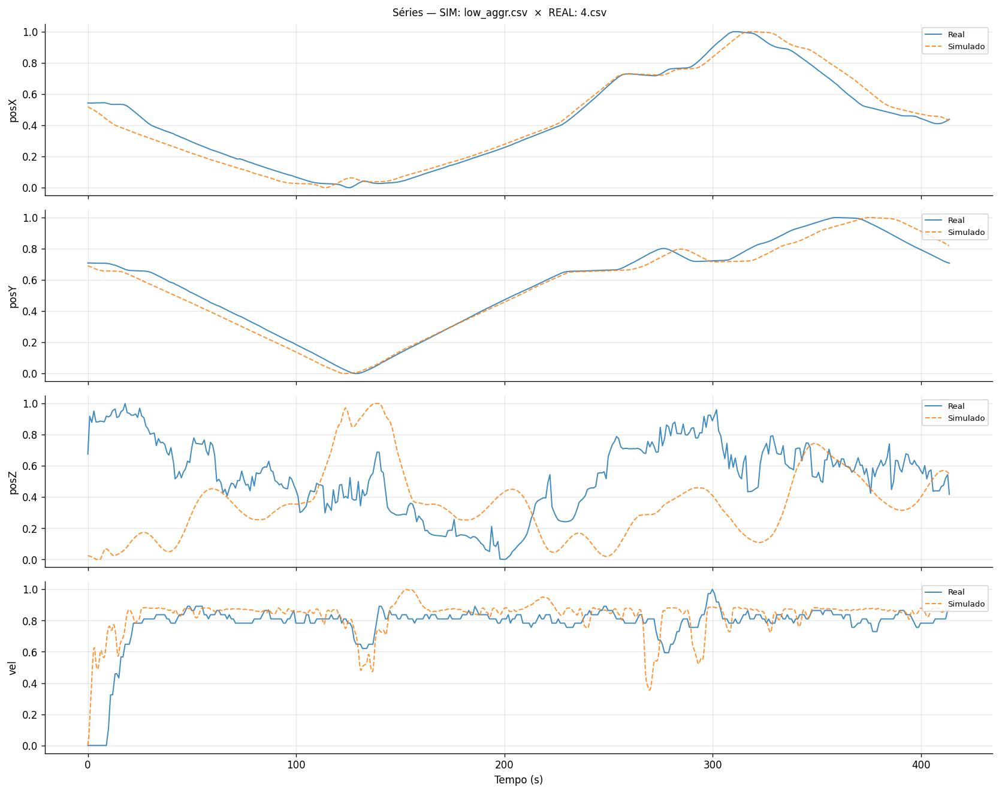

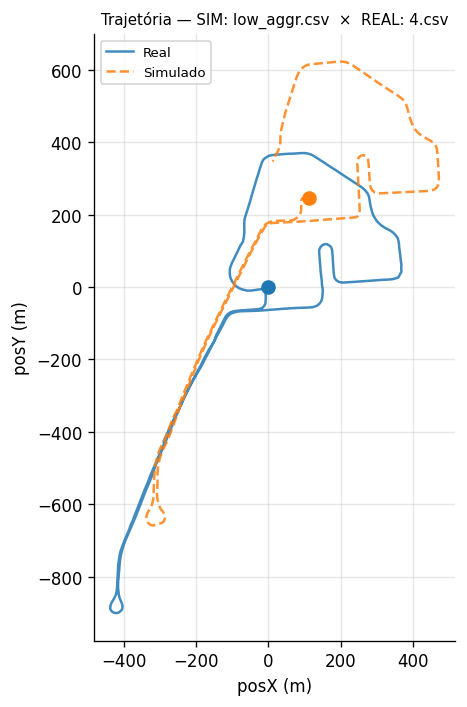

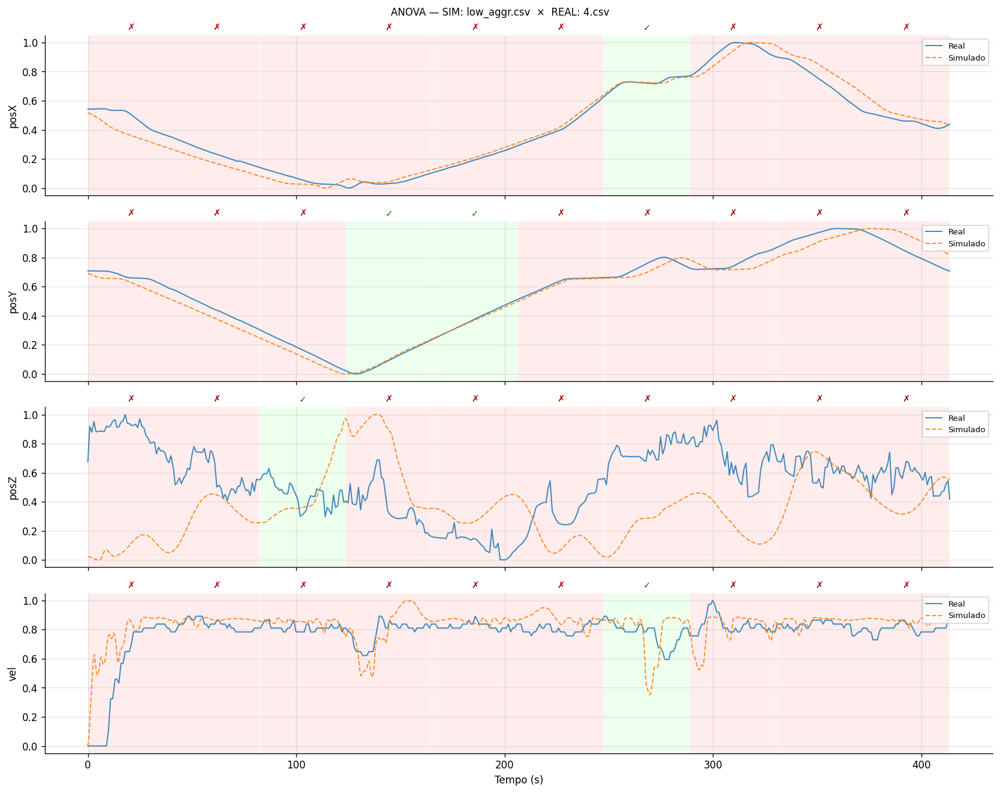

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9824     0.9999          90%  ✗ Divergente
    posY           0.9849     0.9998          80%  ✗ Divergente
    posZ          -0.1894     0.9961          90%  ✗ Divergente
    vel            0.5710     0.9993          90%  ✗ Divergente

  ── SIM: low_aggr.csv  ×  REAL: 5.csv
    Amostras: 4124 | Lags: {'posZ': 0, 'vel': 0, 'posX': -136, 'posY': -71}


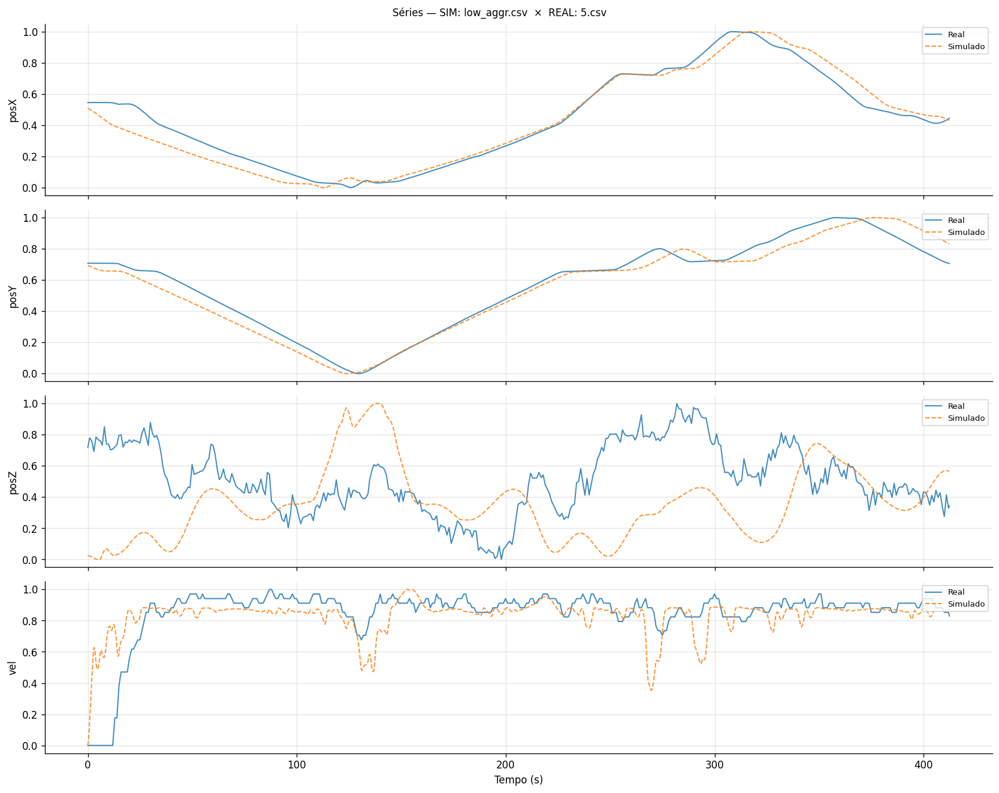

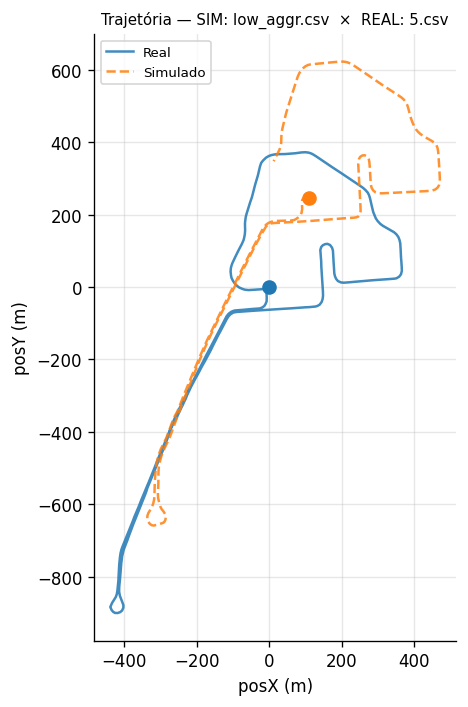

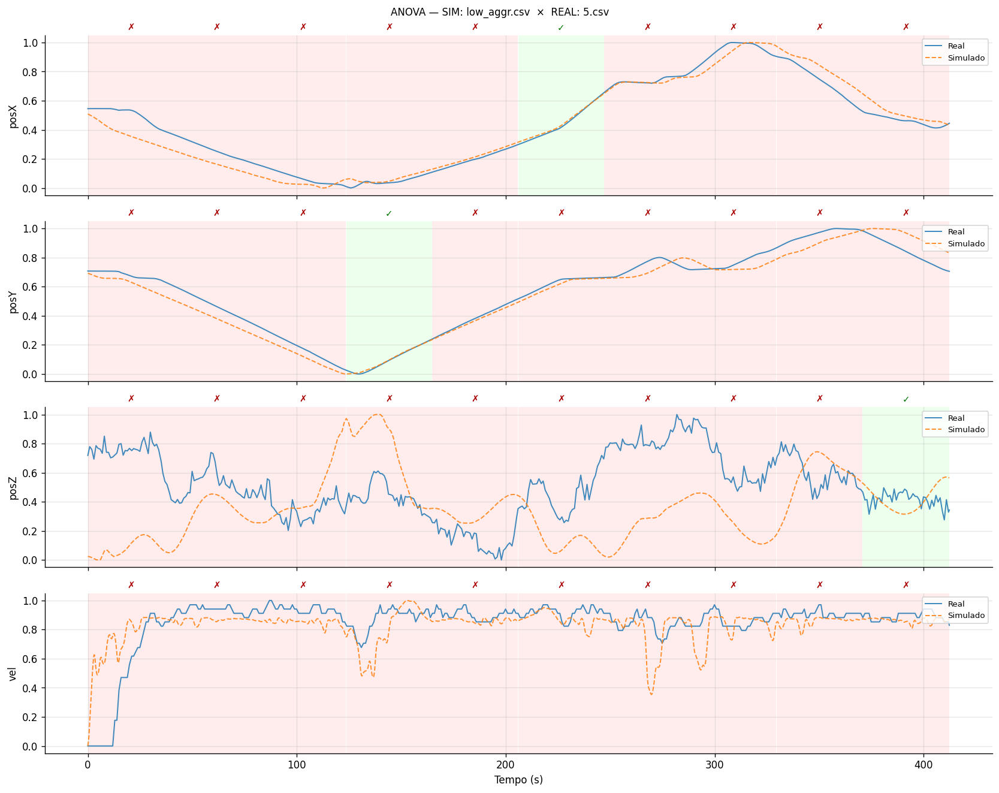

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9768     0.9999          90%  ✗ Divergente
    posY           0.9802     0.9997          90%  ✗ Divergente
    posZ          -0.1662     0.9965          90%  ✗ Divergente
    vel            0.5498     0.9990         100%  ✗ Divergente

  ── SIM: low_aggr.csv  ×  REAL: 6.csv
    Amostras: 4248 | Lags: {'posZ': 0, 'vel': 0, 'posX': -92, 'posY': -78}


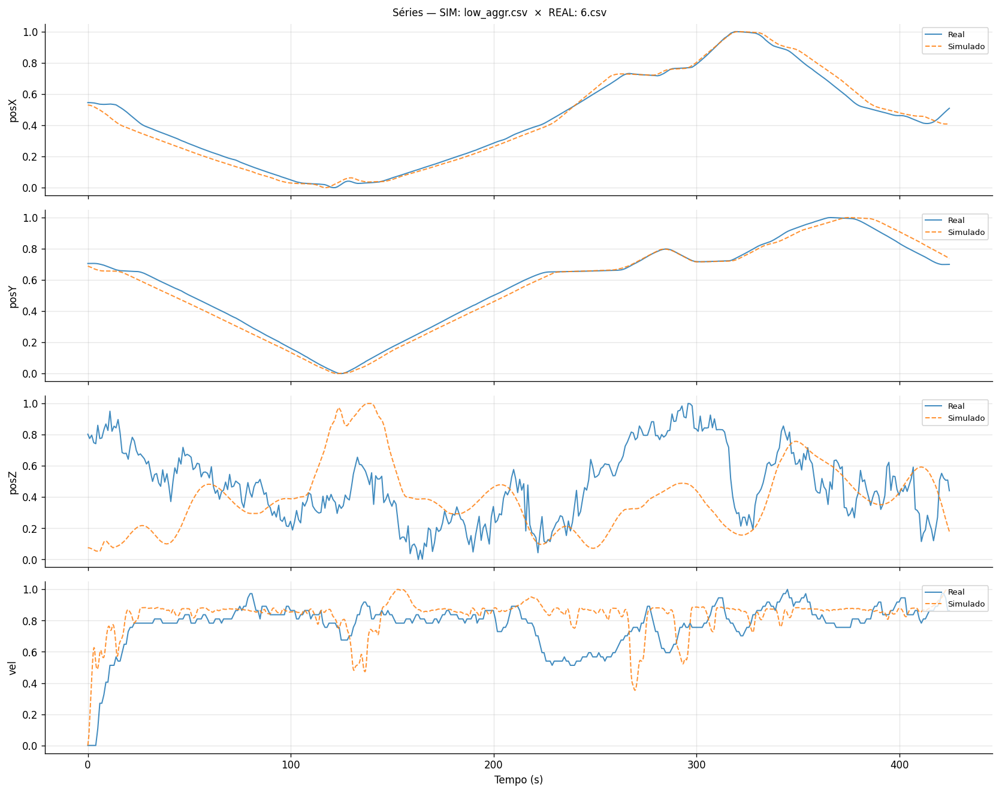

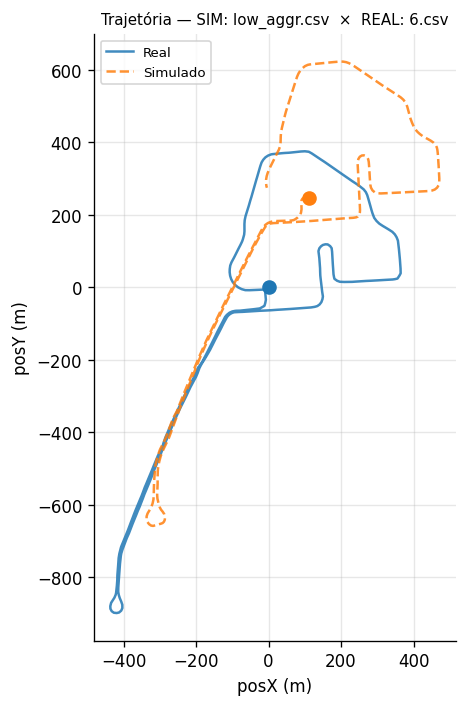

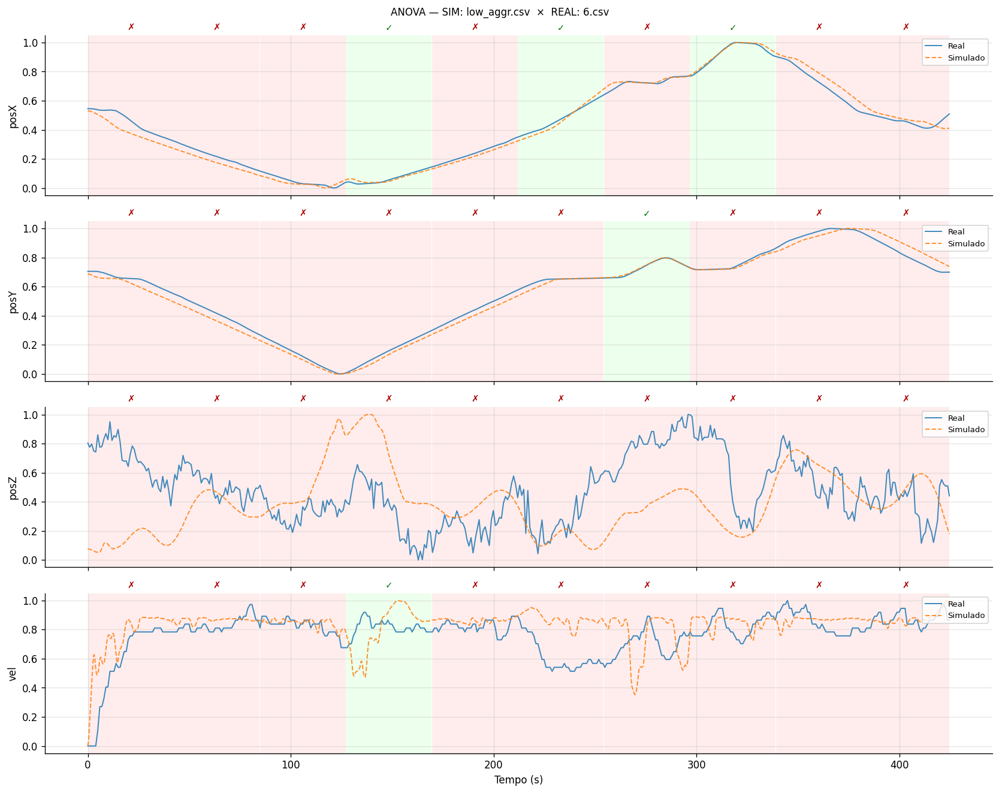

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9936     0.9999          70%  ✗ Divergente
    posY           0.9943     0.9999          90%  ✗ Divergente
    posZ          -0.0163     0.9968         100%  ✗ Divergente
    vel            0.4222     0.9994          90%  ✗ Divergente

  ── SIM: low_aggr.csv  ×  REAL: 7.csv
    Amostras: 3931 | Lags: {'posZ': 0, 'vel': 0, 'posX': -239, 'posY': -164}


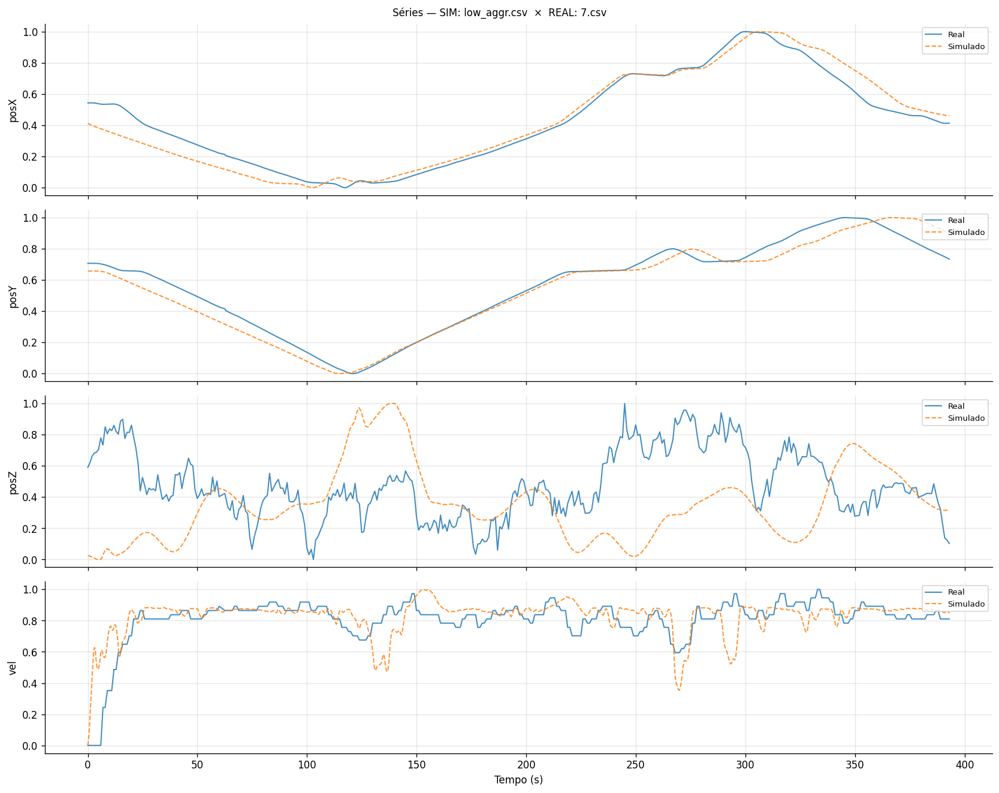

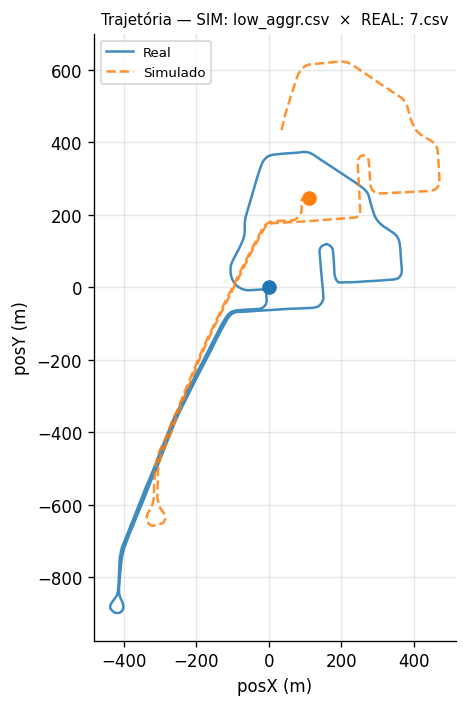

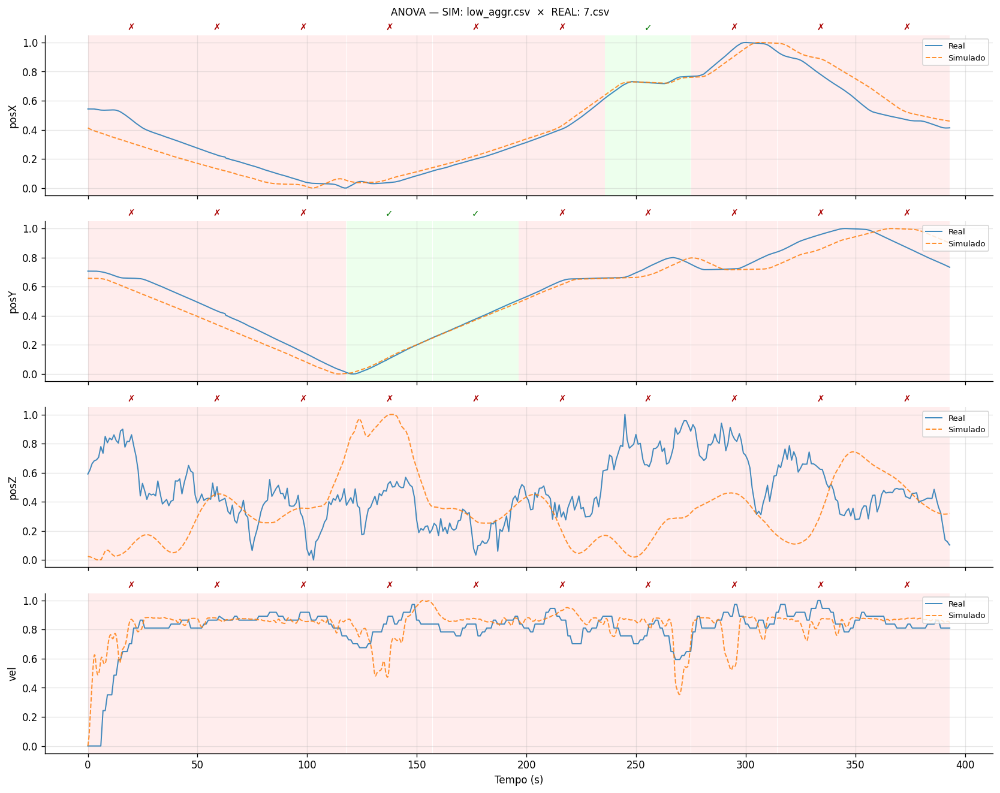

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9718     0.9996          90%  ✗ Divergente
    posY           0.9767     0.9996          80%  ✗ Divergente
    posZ          -0.2790     0.9966         100%  ✗ Divergente
    vel            0.5576     0.9992         100%  ✗ Divergente

  ── SIM: low_aggr.csv  ×  REAL: 8.csv
    Amostras: 4044 | Lags: {'posZ': 0, 'vel': 0, 'posX': -166, 'posY': -104}


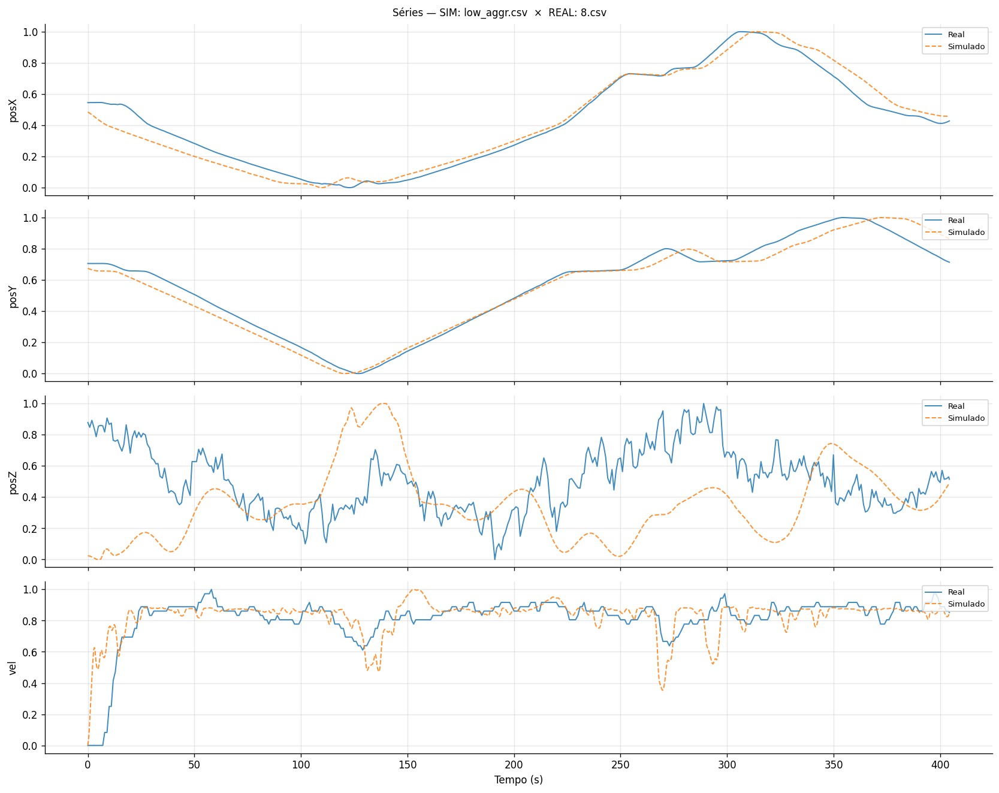

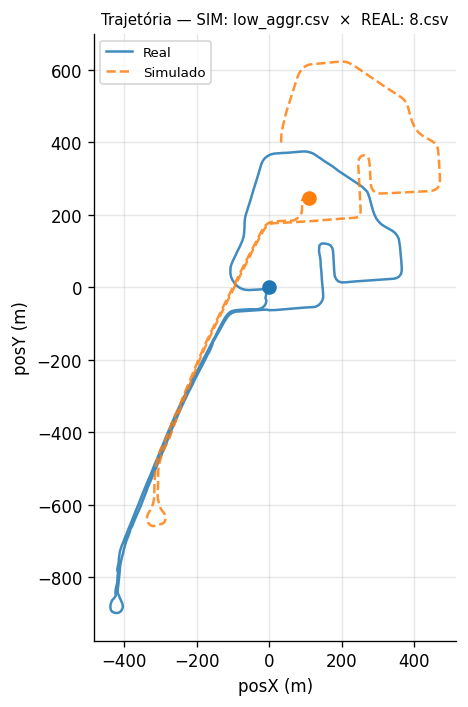

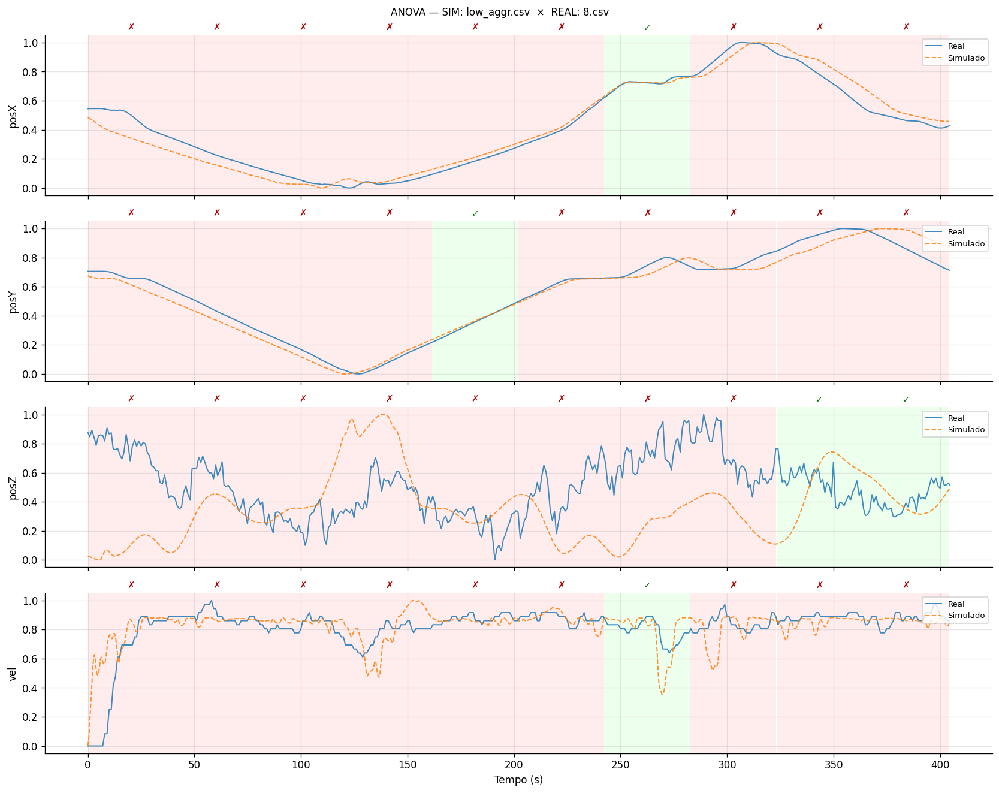

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9785     0.9998          90%  ✗ Divergente
    posY           0.9810     0.9997          90%  ✗ Divergente
    posZ          -0.2084     0.9964          80%  ✗ Divergente
    vel            0.6029     0.9993          90%  ✗ Divergente

  ── SIM: low_aggr.csv  ×  REAL: 9.csv
    Amostras: 3937 | Lags: {'posZ': 0, 'vel': 0, 'posX': -223, 'posY': -139}


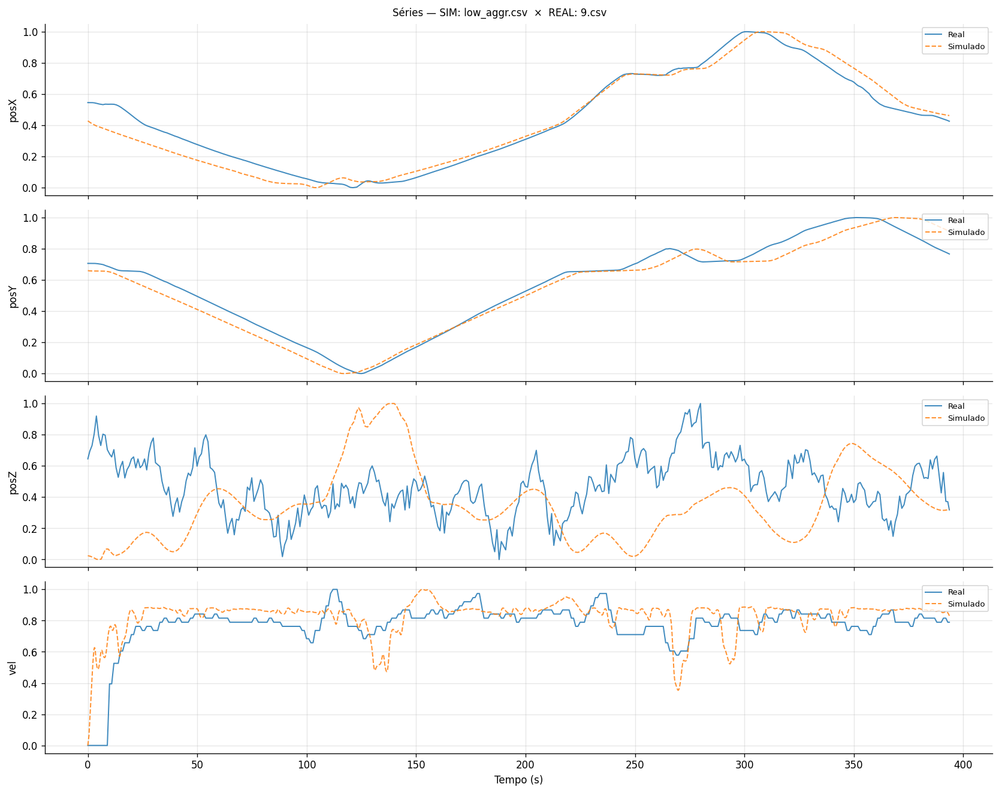

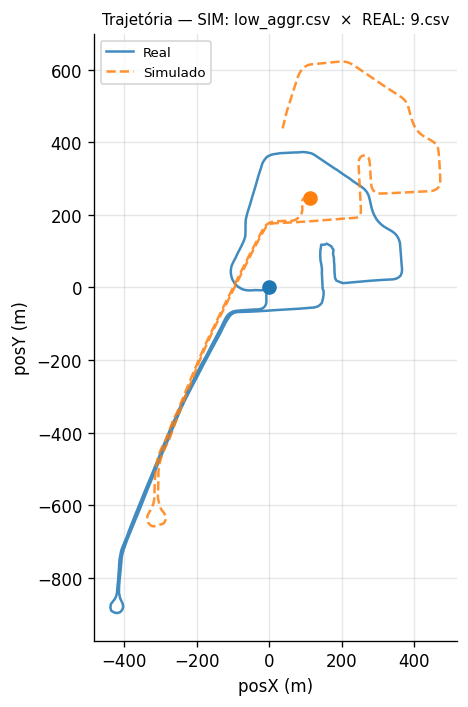

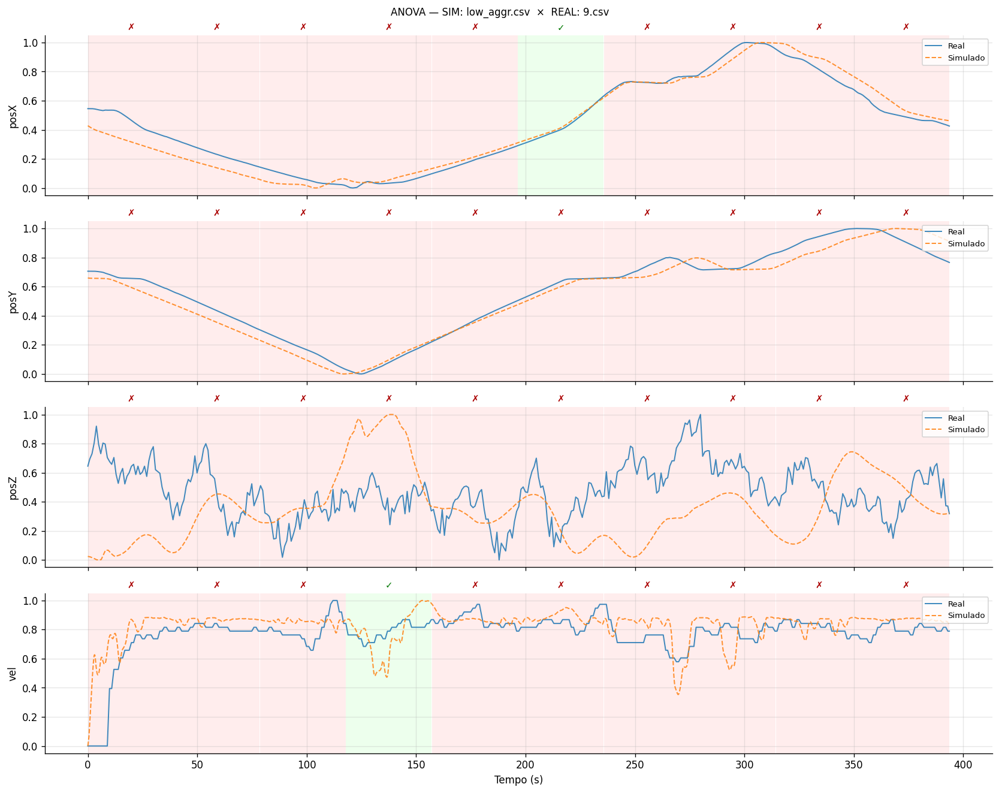

    Variável    Pearson r    DTW sim   ANOVA dif%  Veredicto
    ----------------------------------------------------------
    posX           0.9766     0.9996          90%  ✗ Divergente
    posY           0.9805     0.9997         100%  ✗ Divergente
    posZ          -0.2338     0.9968         100%  ✗ Divergente
    vel            0.5802     0.9993          90%  ✗ Divergente


Loop concluído!


In [26]:
# Armazena todos os resultados
# Estrutura: todos_resultados[nome_sim][nome_real] = {metricas, ...}
todos_resultados = {}

for nome_sim, sim_prep in cache_sim.items():

    todos_resultados[nome_sim] = {}

    print('\n' + '█' * 70)
    print(f'SIMULADO: {nome_sim}')
    print('█' * 70)

    for nome_real, real_prep in cache_real.items():

        label = f'SIM: {nome_sim[:30]}  ×  REAL: {nome_real[:30]}'
        print(f'\n  ── {label}')

        # Colunas disponíveis em ambos
        colunas_ok = [c for c in COLUNAS_CORR
                      if c in real_prep.columns and c in sim_prep.columns]
        if not colunas_ok:
            print('    ERRO: nenhuma coluna comparável')
            continue

        # Alinhar e normalizar
        try:
            df, lags, real_c, sim_c = alinhar_e_normalizar(real_prep, sim_prep, colunas_ok)
        except Exception as e:
            print(f'    ERRO no alinhamento: {e}')
            continue

        t = df.index.total_seconds().values
        print(f'    Amostras: {len(df)} | Lags: { {k:v for k,v in lags.items() if k in colunas_ok} }')

        # ── Plot 1: Séries normalizadas ──────────────────────────────────────
        fig, axes = plt.subplots(len(colunas_ok), 1,
                                 figsize=(14, 2.8 * len(colunas_ok)), sharex=True)
        if len(colunas_ok) == 1:
            axes = [axes]
        for ax, col in zip(axes, colunas_ok):
            ax.plot(t, df[f'real_{col}'],        label='Real',     color='#1f77b4', lw=1.2, alpha=0.85)
            ax.plot(t, df[f'sim_{col}_shifted'], label='Simulado', color='#ff7f0e', lw=1.2, alpha=0.85, ls='--')
            ax.set_ylabel(col, fontsize=10)
            ax.set_ylim(-0.05, 1.05)
            ax.legend(loc='upper right', fontsize=8)
        axes[-1].set_xlabel('Tempo (s)')
        fig.suptitle(f'Séries — {label}', fontsize=10)
        plt.tight_layout()
        plt.show()

        # ── Plot 2: Trajetória ───────────────────────────────────────────────
        if 'posX' in colunas_ok and 'posY' in colunas_ok:
            fig, ax = plt.subplots(figsize=(6, 6))
            ax.plot(real_c['posX'], real_c['posY'], label='Real',     color='#1f77b4', lw=1.5, alpha=0.85)
            ax.plot(sim_c['posX'],  sim_c['posY'],  label='Simulado', color='#ff7f0e', lw=1.5, alpha=0.85, ls='--')
            ax.scatter(real_c['posX'].iloc[0], real_c['posY'].iloc[0], color='#1f77b4', s=60, zorder=5)
            ax.scatter(sim_c['posX'].iloc[0],  sim_c['posY'].iloc[0],  color='#ff7f0e', s=60, zorder=5)
            ax.set_xlabel('posX (m)')
            ax.set_ylabel('posY (m)')
            ax.set_title(f'Trajetória — {label}', fontsize=9)
            ax.legend(fontsize=8)
            ax.set_aspect('equal')
            plt.tight_layout()
            plt.show()

        # ── Calcular métricas ────────────────────────────────────────────────
        metricas = calcular_metricas(df, colunas_ok, N_SEGMENTOS)

        # ── Plot 3: ANOVA ────────────────────────────────────────────────────
        fig, axes = plt.subplots(len(colunas_ok), 1,
                                 figsize=(14, 2.8 * len(colunas_ok)), sharex=True)
        if len(colunas_ok) == 1:
            axes = [axes]
        for ax, col in zip(axes, colunas_ok):
            ax.plot(t, df[f'real_{col}'],        label='Real',     color='#1f77b4', lw=1.2, alpha=0.85)
            ax.plot(t, df[f'sim_{col}_shifted'], label='Simulado', color='#ff7f0e', lw=1.2, alpha=0.85, ls='--')
            for seg in metricas[col]['anova_segs']:
                cor = '#ffcccc' if seg['p'] < 0.05 else '#ccffcc'
                ax.axvspan(seg['ini'], seg['fim'], alpha=0.35, color=cor, lw=0)
                ax.text(
                    (seg['ini'] + seg['fim']) / 2, 1.02,
                    '✗' if seg['p'] < 0.05 else '✓',
                    ha='center', va='bottom', fontsize=9,
                    color='#aa0000' if seg['p'] < 0.05 else '#007700',
                    transform=ax.get_xaxis_transform()
                )
            ax.set_ylabel(col, fontsize=10)
            ax.set_ylim(-0.05, 1.05)
            ax.legend(loc='upper right', fontsize=8)
        axes[-1].set_xlabel('Tempo (s)')
        fig.suptitle(f'ANOVA — {label}', fontsize=10)
        plt.tight_layout()
        plt.show()

        # ── Tabela do par ────────────────────────────────────────────────────
        print(f"    {'Variável':<10} {'Pearson r':>10} {'DTW sim':>10} {'ANOVA dif%':>12}  Veredicto")
        print('    ' + '-' * 58)
        for col in colunas_ok:
            m = metricas[col]
            v = veredicto(m['pearson_r'], m['dtw_sim'], m['anova_pct_dif'])
            print(f"    {col:<10} {m['pearson_r']:>10.4f} {m['dtw_sim']:>10.4f} {m['anova_pct_dif']:>11.0f}%  {v}")

        # Guardar
        todos_resultados[nome_sim][nome_real] = {
            'colunas':  colunas_ok,
            'metricas': metricas
        }

print('\n\nLoop concluído!')

## 6. Comparativo final — heatmaps por métrica

Cada heatmap tem:
- **Linhas** = arquivos simulados
- **Colunas** = arquivos reais
- **Cor** = valor da métrica naquela combinação

Permite identificar visualmente qual simulado melhor representa qual real.

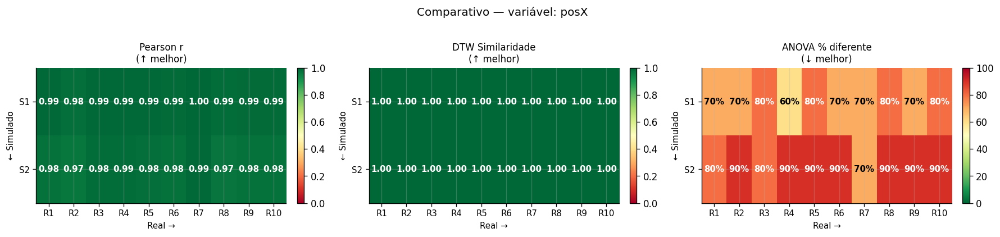

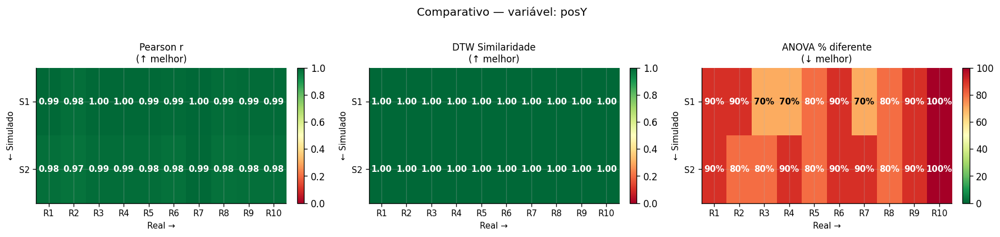

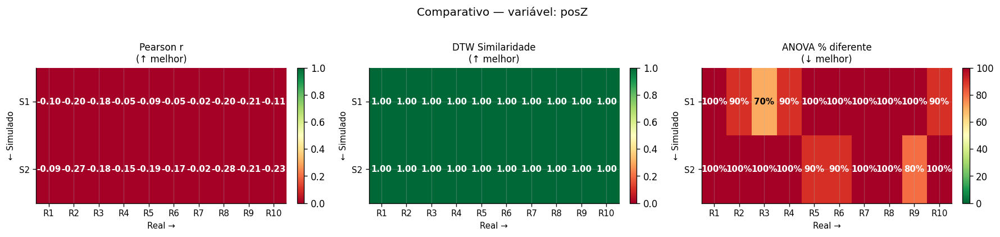

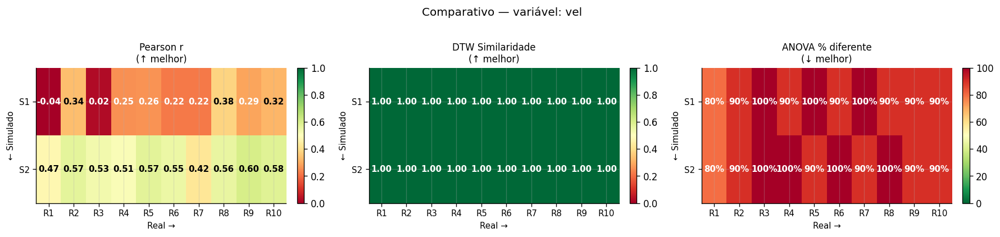

Legenda dos rótulos:
  R1 = 1.csv
  R2 = 10.csv
  R3 = 2.csv
  R4 = 3.csv
  R5 = 4.csv
  R6 = 5.csv
  R7 = 6.csv
  R8 = 7.csv
  R9 = 8.csv
  R10 = 9.csv
  S1 = high_aggr.csv
  S2 = low_aggr.csv


In [27]:
nomes_sim  = list(cache_sim.keys())
nomes_real = list(cache_real.keys())
ns, nr     = len(nomes_sim), len(nomes_real)

if ns < 1 or nr < 1:
    print('Sem resultados para exibir.')
else:
    # Montar matrizes para cada variável e cada métrica
    # Shape: (n_sim, n_real)
    def montar_matriz(metrica_key, col):
        M = np.full((ns, nr), np.nan)
        for si, ns_ in enumerate(nomes_sim):
            for ri, nr_ in enumerate(nomes_real):
                try:
                    M[si, ri] = todos_resultados[ns_][nr_]['metricas'][col][metrica_key]
                except (KeyError, TypeError):
                    pass
        return M

    # Rótulos curtos para os eixos
    label_sim  = [f'S{i+1}' for i in range(ns)]
    label_real = [f'R{i+1}' for i in range(nr)]

    metricas_config = [
        ('pearson_r',    'Pearson r',           'RdYlGn', 0,   1,   True),
        ('dtw_sim',      'DTW Similaridade',    'RdYlGn', 0,   1,   True),
        ('anova_pct_dif','ANOVA % diferente',   'RdYlGn_r', 0, 100, False),
    ]

    for col in COLUNAS_CORR:
        fig, axes = plt.subplots(1, 3, figsize=(15, max(3, ns * 0.7 + 2)))

        for ax, (mk, titulo, cmap, vmin, vmax, maior_melhor) in zip(axes, metricas_config):
            M = montar_matriz(mk, col)
            im = ax.imshow(M, cmap=cmap, vmin=vmin, vmax=vmax, aspect='auto')

            # Anotações numéricas em cada célula
            for si in range(ns):
                for ri in range(nr):
                    val = M[si, ri]
                    if not np.isnan(val):
                        txt = f'{val:.2f}' if mk != 'anova_pct_dif' else f'{val:.0f}%'
                        # Cor do texto: preto em fundo claro, branco em fundo escuro
                        norm_val = (val - vmin) / (vmax - vmin)
                        txt_cor  = 'black' if 0.3 < norm_val < 0.8 else 'white'
                        ax.text(ri, si, txt, ha='center', va='center',
                                fontsize=9, color=txt_cor, fontweight='bold')

            ax.set_xticks(range(nr))
            ax.set_xticklabels(label_real, fontsize=9)
            ax.set_yticks(range(ns))
            ax.set_yticklabels(label_sim, fontsize=9)
            ax.set_xlabel('Real →', fontsize=9)
            ax.set_ylabel('← Simulado', fontsize=9)
            nota = '↑ melhor' if maior_melhor else '↓ melhor'
            ax.set_title(f'{titulo}\n({nota})', fontsize=10)
            plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

        fig.suptitle(f'Comparativo — variável: {col}', fontsize=12, y=1.02)
        plt.tight_layout()
        plt.show()

    # ── Legenda dos rótulos ──────────────────────────────────────────────────
    print('Legenda dos rótulos:')
    for i, f in enumerate(nomes_real):
        print(f'  R{i+1} = {f}')
    for i, f in enumerate(nomes_sim):
        print(f'  S{i+1} = {f}')

## 7. Tabela final consolidada
Todas as combinações em uma tabela única, ordenada por Pearson r decrescente.

In [28]:
linhas = []
for nome_sim in nomes_sim:
    for nome_real in nomes_real:
        try:
            res = todos_resultados[nome_sim][nome_real]
        except KeyError:
            continue
        for col in res['colunas']:
            m = res['metricas'][col]
            linhas.append({
                'Simulado':   nome_sim,
                'Real':       nome_real,
                'Variável':   col,
                'Pearson r':  round(m['pearson_r'],    4),
                'DTW sim':    round(m['dtw_sim'],       4),
                'ANOVA dif%': round(m['anova_pct_dif'], 1),
                'Veredicto':  veredicto(m['pearson_r'], m['dtw_sim'], m['anova_pct_dif'])
            })

tabela = pd.DataFrame(linhas)

# Ordenar: melhor Pearson primeiro dentro de cada variável
tabela = tabela.sort_values(['Variável', 'Pearson r'], ascending=[True, False])

print(tabela.to_string(index=False))
print(f'\nTotal de combinações: {len(tabela)}')

     Simulado   Real Variável  Pearson r  DTW sim  ANOVA dif%    Veredicto
high_aggr.csv  6.csv     posX     0.9964   0.9998        70.0 ✗ Divergente
high_aggr.csv  3.csv     posX     0.9945   0.9998        60.0 ✗ Divergente
high_aggr.csv  2.csv     posX     0.9943   0.9998        80.0 ✗ Divergente
 low_aggr.csv  6.csv     posX     0.9936   0.9999        70.0 ✗ Divergente
high_aggr.csv  4.csv     posX     0.9930   0.9998        80.0 ✗ Divergente
high_aggr.csv  1.csv     posX     0.9922   0.9999        70.0 ✗ Divergente
high_aggr.csv  8.csv     posX     0.9902   0.9998        70.0 ✗ Divergente
high_aggr.csv  5.csv     posX     0.9892   0.9998        70.0 ✗ Divergente
high_aggr.csv  9.csv     posX     0.9892   0.9999        80.0 ✗ Divergente
 low_aggr.csv  3.csv     posX     0.9861   0.9999        90.0 ✗ Divergente
high_aggr.csv  7.csv     posX     0.9853   0.9998        80.0 ✗ Divergente
 low_aggr.csv  2.csv     posX     0.9845   0.9999        80.0 ✗ Divergente
 low_aggr.csv  4.csv     